I refered 'GAN Introduction' of  Nanashi-san.
https://www.kaggle.com/code/jesucristo/gan-introduction/notebook
Thank you very much for sharing impressive introduction.

For the first time, I tried GANs. So it is not enough and I need more learning. I appreciate it if I can get your feedback.

In my notebook 'I am trying to produce labels using GAN's  

"Labeled medical imaging data is scarce and expensive to generate. To achieve generalizable deep learning models large amounts of data are needed. Standard data augmentation is a method to increase generalizability and is routinely performed. Generative adversarial networks offer a novel method for data augmentation."

Actually, this kind of technology is still expensive for small hospitals, some area or countries etc... and it may cause health gap. But it means that if this kind of tech spread widely, it will reduce health gap, improve the productivity of medical examination and save a lot of people.

So I tried GAN to confirm how it works, although it is still not enough and I need more learning....

# Importing

In [2]:
!pip install kagglehub


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


c:\Users\Kirthi\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|██████████| 1.52G/1.52G [09:08<00:00, 2.97MB/s] 

Extracting files...


In [1]:
import os
print(os.listdir("/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone"))

FileNotFoundError: [WinError 3] The system cannot find the path specified: '/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone'

In [2]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

import time
import random
import glob

import cv2
from PIL import Image

# Sample Images

* Healthy

There are 5077 pictures of Healthy.


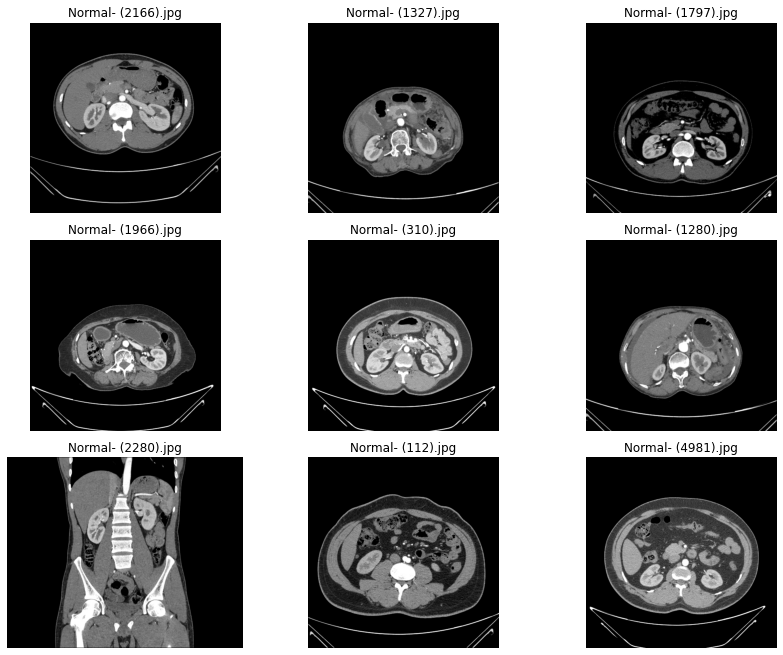

In [3]:
PATH1 = '/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Normal/'
images = os.listdir(PATH1)
print(f'There are {len(os.listdir(PATH1))} pictures of Healthy.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH1)))
    img = plt.imread(PATH1 + images[rnd_indx])
    imgplot = axis.imshow(img)
    
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

* Severe

There are 3709 Kidney with Cyst.


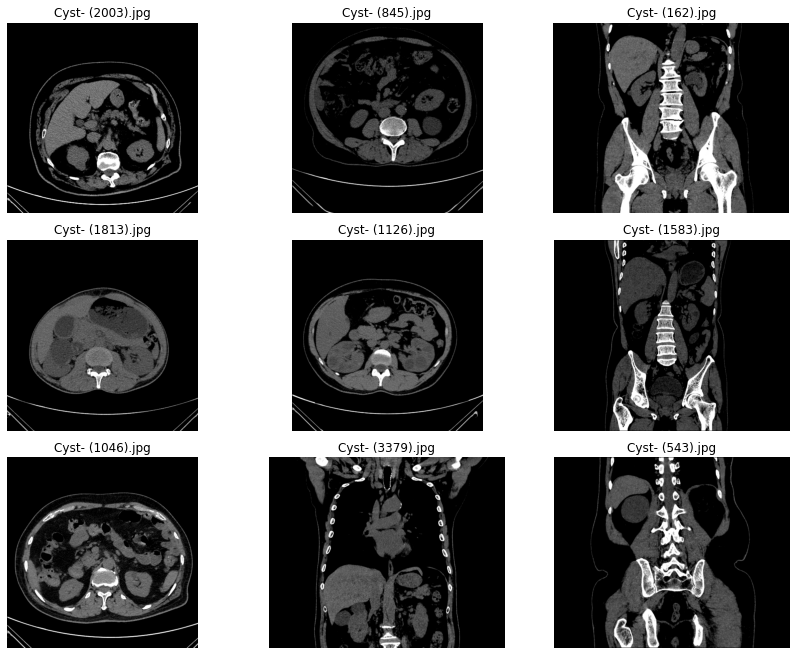

In [4]:
PATH2 = '/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Cyst/'
images2 = os.listdir(PATH2)
print(f'There are {len(os.listdir(PATH2))} Kidney with Cyst.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH2)))
    img = plt.imread(PATH2 + images2[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images2[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Image Preprocessing

In [5]:
batch_size = 32
batchSize = 64
imageSize = 64

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

In [6]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
train_data = datasets.ImageFolder('/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/', transform=transform)

train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

In [7]:
train_data

Dataset ImageFolder
    Number of datapoints: 12446
    Root location: /kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=bilinear, max_size=None, antialias=None)
               CenterCrop(size=(64, 64))
               RandomHorizontalFlip(p=0.5)
               RandomApply(
               p=0.2
               ColorJitter(brightness=None, contrast=None, saturation=None, hue=None)
               RandomRotation(degrees=[-20.0, 20.0], interpolation=nearest, expand=False, fill=0)
           )
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )

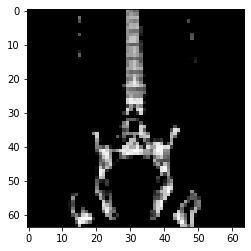

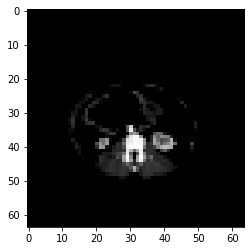

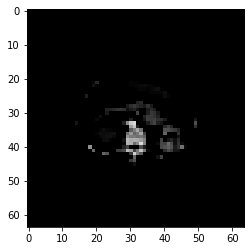

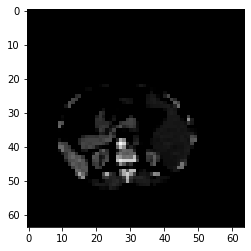

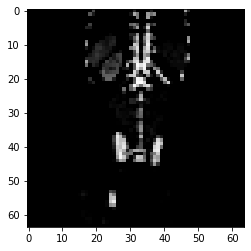

In [8]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

# Weights

In [9]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [10]:
class G(nn.Module):
    def __init__(self):
        super(G, self).__init__()
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [11]:
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output.view(-1)
    
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [12]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

# Training

In [13]:
!mkdir results
!ls

__notebook__.ipynb  results


In [14]:
EPOCH = 1
LR = 0.0001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [15]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        netD.zero_grad()
        
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

[0/1][0/389] Loss_D: 1.7286; Loss_G: 2.8542
[0/1][1/389] Loss_D: 0.8347; Loss_G: 3.7934
[0/1][2/389] Loss_D: 0.6334; Loss_G: 4.0936
[0/1][3/389] Loss_D: 0.2865; Loss_G: 4.3139
[0/1][4/389] Loss_D: 0.2032; Loss_G: 4.2899
[0/1][5/389] Loss_D: 0.2902; Loss_G: 4.1282
[0/1][6/389] Loss_D: 0.2375; Loss_G: 4.2838
[0/1][7/389] Loss_D: 0.2082; Loss_G: 4.5352
[0/1][8/389] Loss_D: 0.1215; Loss_G: 4.7764
[0/1][9/389] Loss_D: 0.2074; Loss_G: 4.5800
[0/1][10/389] Loss_D: 0.1369; Loss_G: 4.7396
[0/1][11/389] Loss_D: 0.1154; Loss_G: 4.8605
[0/1][12/389] Loss_D: 0.1638; Loss_G: 5.0053
[0/1][13/389] Loss_D: 0.1096; Loss_G: 5.1466
[0/1][14/389] Loss_D: 0.1444; Loss_G: 5.1733
[0/1][15/389] Loss_D: 0.2065; Loss_G: 5.0107
[0/1][16/389] Loss_D: 0.1209; Loss_G: 5.2213
[0/1][17/389] Loss_D: 0.1056; Loss_G: 5.4262
[0/1][18/389] Loss_D: 0.0902; Loss_G: 5.5479
[0/1][19/389] Loss_D: 0.0880; Loss_G: 5.5326
[0/1][20/389] Loss_D: 0.0708; Loss_G: 5.5830
[0/1][21/389] Loss_D: 0.0855; Loss_G: 5.7573
[0/1][22/389] Loss_D

In [16]:
batch_size = 32
LR_G = 0.0005
LR_D = 0.0001

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [17]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [18]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [19]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/389 [00:00<?, ?it/s]

[1/100][194/389] Loss_D: 1.5574 Loss_G: 0.8185 D(x): 0.4083 D(G(z)): 0.4872 / 0.4295
[1/100][388/389] Loss_D: 1.4021 Loss_G: 0.7713 D(x): 0.4664 D(G(z)): 0.4781 / 0.4545


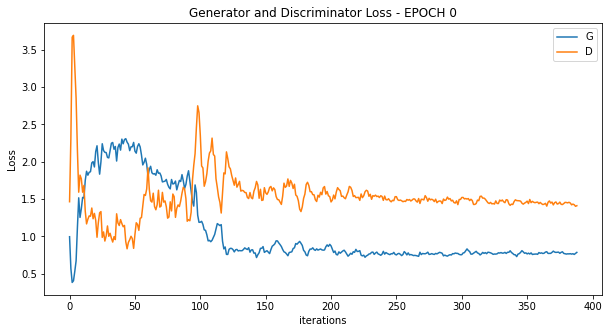

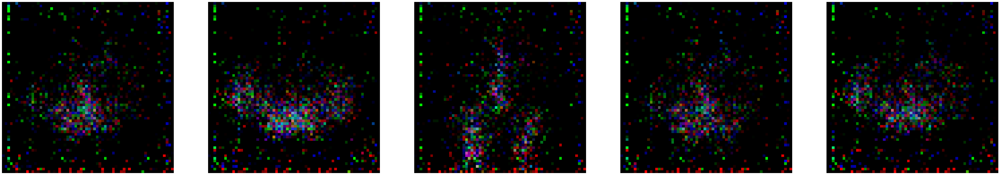

  0%|          | 0/389 [00:00<?, ?it/s]

[2/100][194/389] Loss_D: 1.3881 Loss_G: 0.7919 D(x): 0.4529 D(G(z)): 0.4579 / 0.4433
[2/100][388/389] Loss_D: 1.4063 Loss_G: 0.7765 D(x): 0.4460 D(G(z)): 0.4616 / 0.4515


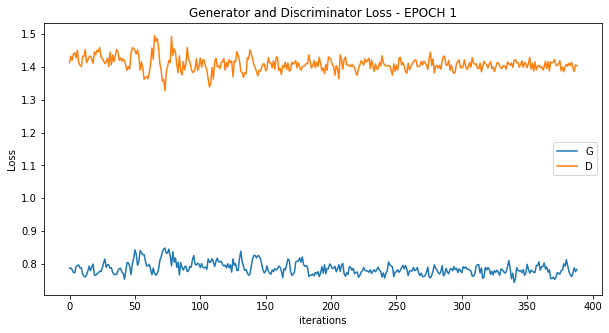

  0%|          | 0/389 [00:00<?, ?it/s]

[3/100][194/389] Loss_D: 1.4076 Loss_G: 0.8060 D(x): 0.4422 D(G(z)): 0.4574 / 0.4365
[3/100][388/389] Loss_D: 1.3878 Loss_G: 0.7831 D(x): 0.4590 D(G(z)): 0.4644 / 0.4479


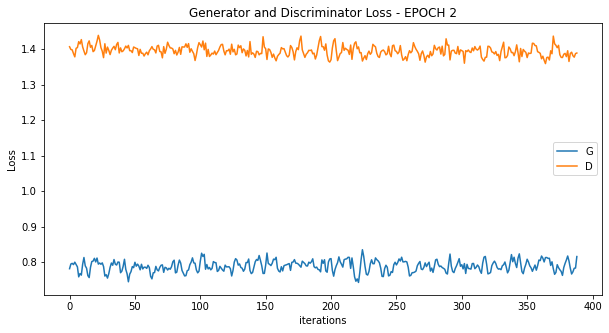

  0%|          | 0/389 [00:00<?, ?it/s]

[4/100][194/389] Loss_D: 1.3793 Loss_G: 0.8110 D(x): 0.4455 D(G(z)): 0.4454 / 0.4337
[4/100][388/389] Loss_D: 1.3790 Loss_G: 0.8131 D(x): 0.4552 D(G(z)): 0.4558 / 0.4320


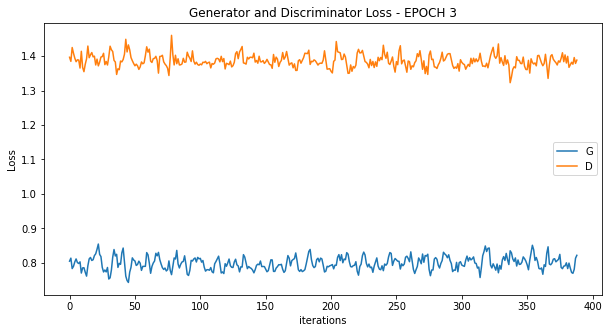

  0%|          | 0/389 [00:00<?, ?it/s]

[5/100][194/389] Loss_D: 1.4033 Loss_G: 0.7979 D(x): 0.4479 D(G(z)): 0.4615 / 0.4399
[5/100][388/389] Loss_D: 1.3854 Loss_G: 0.8209 D(x): 0.4307 D(G(z)): 0.4341 / 0.4278


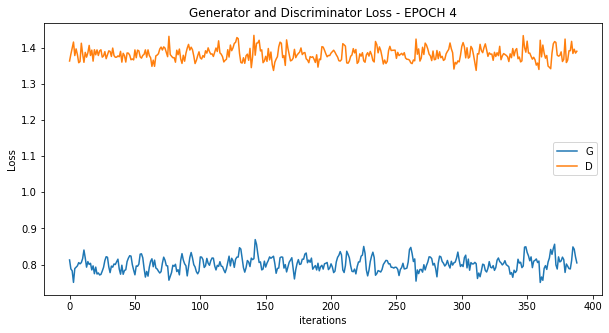

  0%|          | 0/389 [00:00<?, ?it/s]

[6/100][194/389] Loss_D: 1.3776 Loss_G: 0.7755 D(x): 0.4436 D(G(z)): 0.4436 / 0.4522
[6/100][388/389] Loss_D: 1.3799 Loss_G: 0.7978 D(x): 0.4538 D(G(z)): 0.4551 / 0.4400


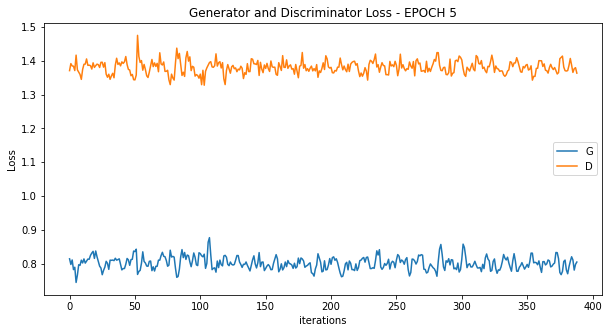

  0%|          | 0/389 [00:00<?, ?it/s]

[7/100][194/389] Loss_D: 1.3675 Loss_G: 0.8128 D(x): 0.4519 D(G(z)): 0.4444 / 0.4330
[7/100][388/389] Loss_D: 1.3583 Loss_G: 0.8262 D(x): 0.4576 D(G(z)): 0.4453 / 0.4258


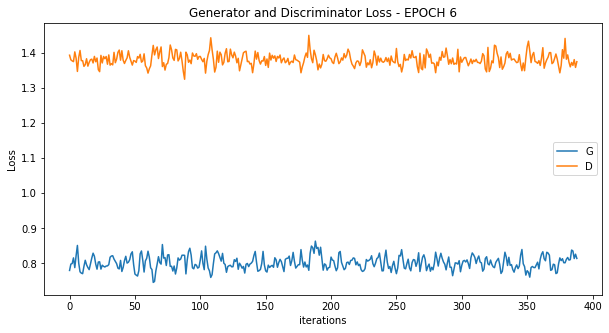

  0%|          | 0/389 [00:00<?, ?it/s]

[8/100][194/389] Loss_D: 1.3904 Loss_G: 0.7737 D(x): 0.4483 D(G(z)): 0.4553 / 0.4534
[8/100][388/389] Loss_D: 1.4048 Loss_G: 0.7904 D(x): 0.4452 D(G(z)): 0.4586 / 0.4455


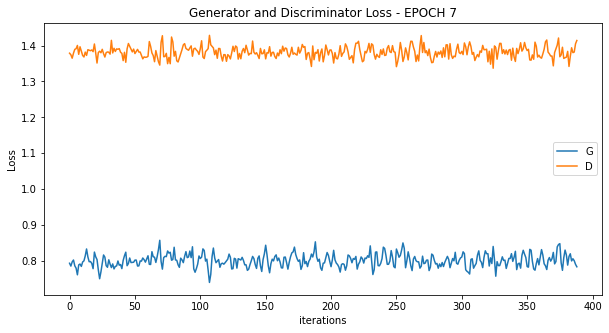

  0%|          | 0/389 [00:00<?, ?it/s]

[9/100][194/389] Loss_D: 1.3829 Loss_G: 0.8314 D(x): 0.4483 D(G(z)): 0.4483 / 0.4233
[9/100][388/389] Loss_D: 1.3558 Loss_G: 0.8235 D(x): 0.4834 D(G(z)): 0.4686 / 0.4273


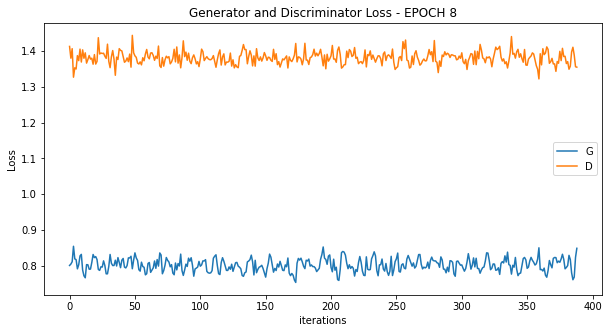

  0%|          | 0/389 [00:00<?, ?it/s]

[10/100][194/389] Loss_D: 1.3792 Loss_G: 0.7837 D(x): 0.4536 D(G(z)): 0.4538 / 0.4476
[10/100][388/389] Loss_D: 1.4227 Loss_G: 0.7603 D(x): 0.4421 D(G(z)): 0.4642 / 0.4614


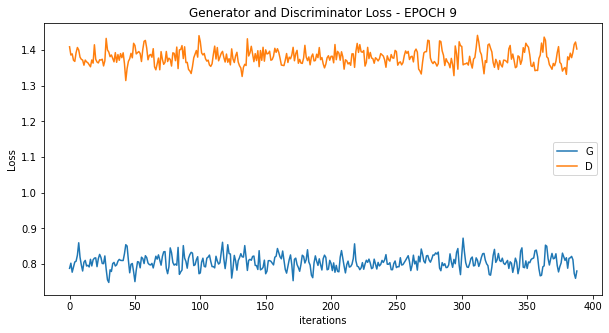

  0%|          | 0/389 [00:00<?, ?it/s]

[11/100][194/389] Loss_D: 1.3873 Loss_G: 0.7621 D(x): 0.4496 D(G(z)): 0.4537 / 0.4597
[11/100][388/389] Loss_D: 1.3677 Loss_G: 0.8300 D(x): 0.4564 D(G(z)): 0.4490 / 0.4245


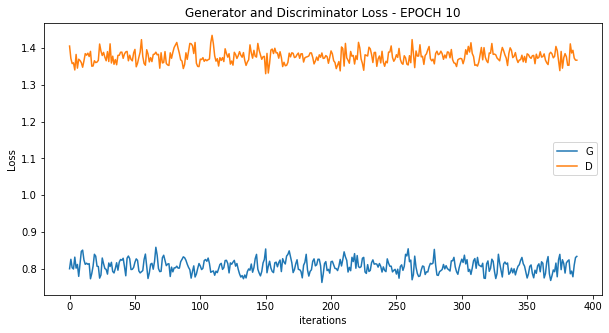

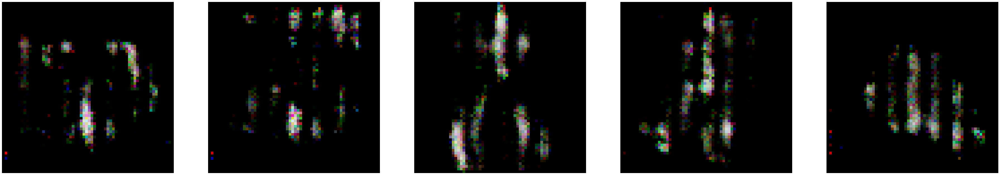

  0%|          | 0/389 [00:00<?, ?it/s]

[12/100][194/389] Loss_D: 1.3771 Loss_G: 0.8046 D(x): 0.4669 D(G(z)): 0.4646 / 0.4370
[12/100][388/389] Loss_D: 1.3715 Loss_G: 0.8197 D(x): 0.4408 D(G(z)): 0.4360 / 0.4285


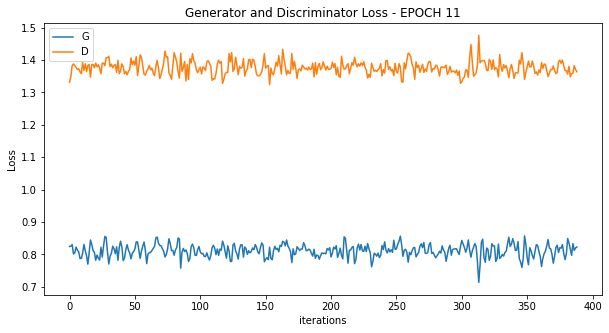

  0%|          | 0/389 [00:00<?, ?it/s]

[13/100][194/389] Loss_D: 1.3771 Loss_G: 0.7899 D(x): 0.4556 D(G(z)): 0.4538 / 0.4453
[13/100][388/389] Loss_D: 1.3612 Loss_G: 0.8231 D(x): 0.4496 D(G(z)): 0.4390 / 0.4274


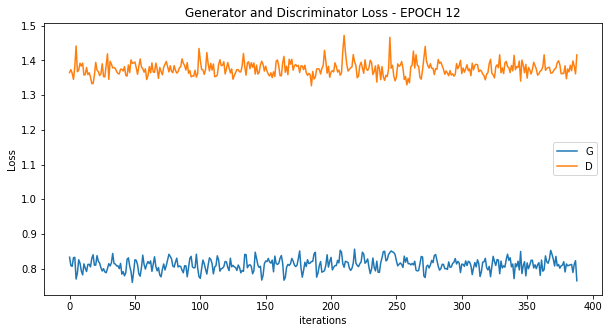

  0%|          | 0/389 [00:00<?, ?it/s]

[14/100][194/389] Loss_D: 1.3505 Loss_G: 0.8287 D(x): 0.4603 D(G(z)): 0.4440 / 0.4244
[14/100][388/389] Loss_D: 1.3734 Loss_G: 0.8277 D(x): 0.4375 D(G(z)): 0.4322 / 0.4255


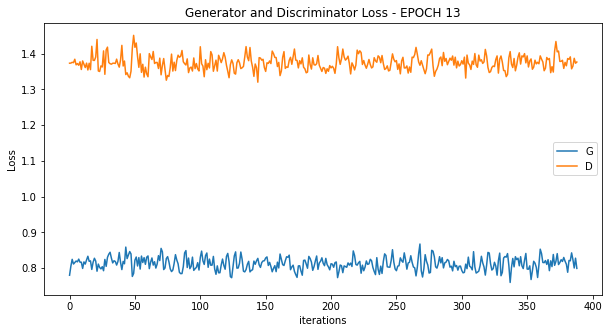

  0%|          | 0/389 [00:00<?, ?it/s]

[15/100][194/389] Loss_D: 1.4003 Loss_G: 0.7888 D(x): 0.4443 D(G(z)): 0.4557 / 0.4452
[15/100][388/389] Loss_D: 1.3595 Loss_G: 0.8131 D(x): 0.4758 D(G(z)): 0.4628 / 0.4340


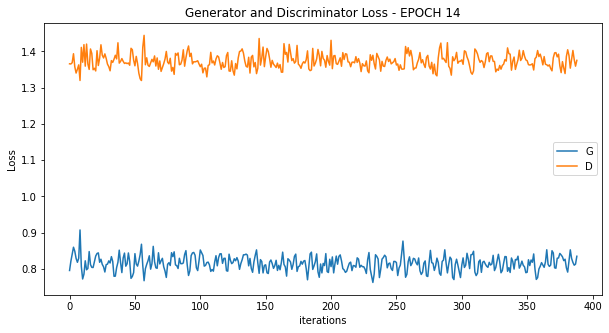

  0%|          | 0/389 [00:00<?, ?it/s]

[16/100][194/389] Loss_D: 1.3717 Loss_G: 0.8253 D(x): 0.4574 D(G(z)): 0.4517 / 0.4261
[16/100][388/389] Loss_D: 1.4058 Loss_G: 0.8160 D(x): 0.4344 D(G(z)): 0.4457 / 0.4312


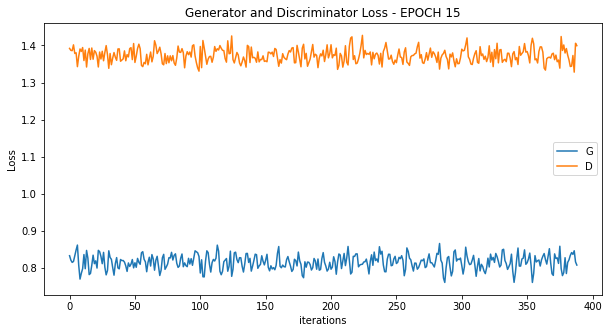

  0%|          | 0/389 [00:00<?, ?it/s]

[17/100][194/389] Loss_D: 1.3700 Loss_G: 0.8010 D(x): 0.4406 D(G(z)): 0.4342 / 0.4393
[17/100][388/389] Loss_D: 1.3811 Loss_G: 0.8163 D(x): 0.4427 D(G(z)): 0.4418 / 0.4308


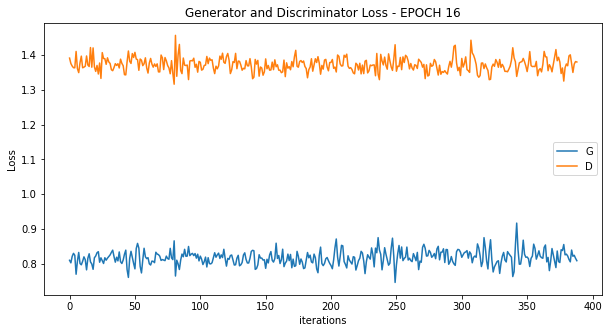

  0%|          | 0/389 [00:00<?, ?it/s]

[18/100][194/389] Loss_D: 1.3391 Loss_G: 0.8296 D(x): 0.4721 D(G(z)): 0.4488 / 0.4238
[18/100][388/389] Loss_D: 1.3559 Loss_G: 0.8454 D(x): 0.4715 D(G(z)): 0.4577 / 0.4164


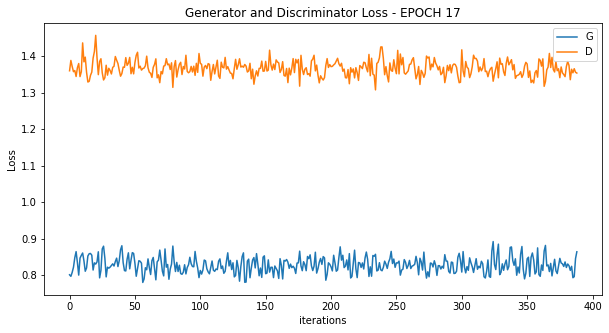

  0%|          | 0/389 [00:00<?, ?it/s]

[19/100][194/389] Loss_D: 1.3770 Loss_G: 0.8330 D(x): 0.4145 D(G(z)): 0.4082 / 0.4222
[19/100][388/389] Loss_D: 1.3990 Loss_G: 0.8201 D(x): 0.4535 D(G(z)): 0.4596 / 0.4304


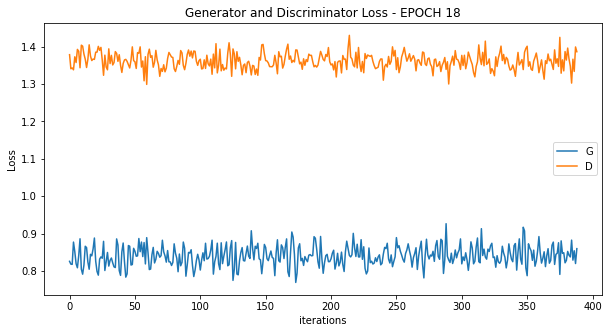

  0%|          | 0/389 [00:00<?, ?it/s]

[20/100][194/389] Loss_D: 1.3739 Loss_G: 0.8232 D(x): 0.4445 D(G(z)): 0.4359 / 0.4275
[20/100][388/389] Loss_D: 1.3470 Loss_G: 0.8174 D(x): 0.4577 D(G(z)): 0.4380 / 0.4318


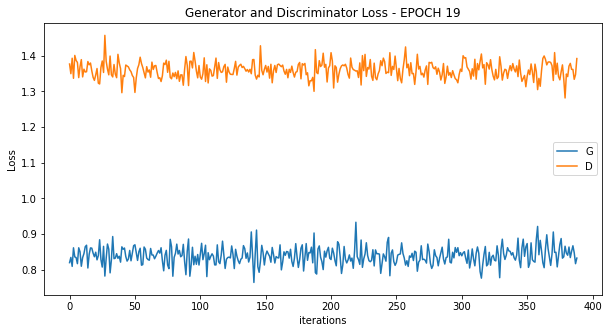

  0%|          | 0/389 [00:00<?, ?it/s]

[21/100][194/389] Loss_D: 1.3487 Loss_G: 0.8538 D(x): 0.4695 D(G(z)): 0.4498 / 0.4115
[21/100][388/389] Loss_D: 1.3841 Loss_G: 0.8917 D(x): 0.4799 D(G(z)): 0.4770 / 0.3949


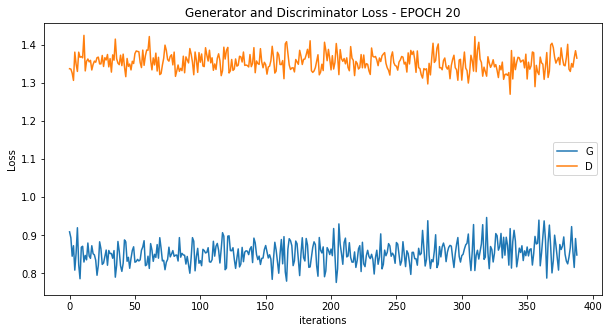

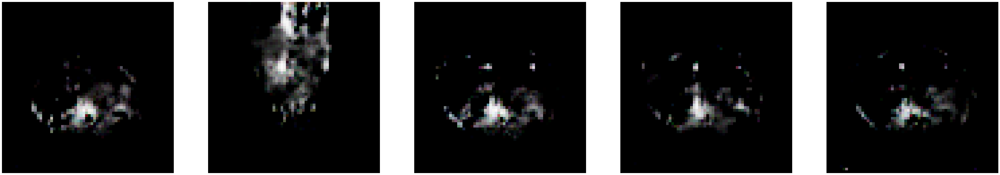

  0%|          | 0/389 [00:00<?, ?it/s]

[22/100][194/389] Loss_D: 1.3181 Loss_G: 0.8863 D(x): 0.5028 D(G(z)): 0.4645 / 0.3972
[22/100][388/389] Loss_D: 1.3445 Loss_G: 0.8717 D(x): 0.4715 D(G(z)): 0.4501 / 0.4033


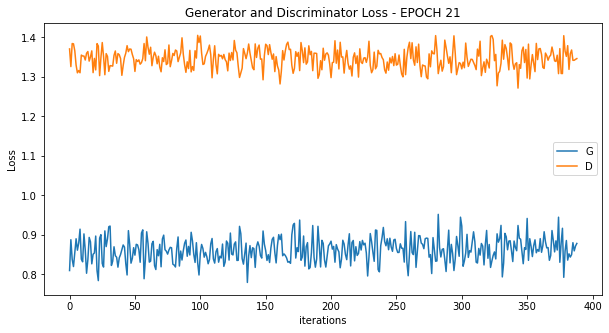

  0%|          | 0/389 [00:00<?, ?it/s]

[23/100][194/389] Loss_D: 1.3165 Loss_G: 0.8694 D(x): 0.4788 D(G(z)): 0.4410 / 0.4063
[23/100][388/389] Loss_D: 1.3480 Loss_G: 0.8290 D(x): 0.4316 D(G(z)): 0.4036 / 0.4285


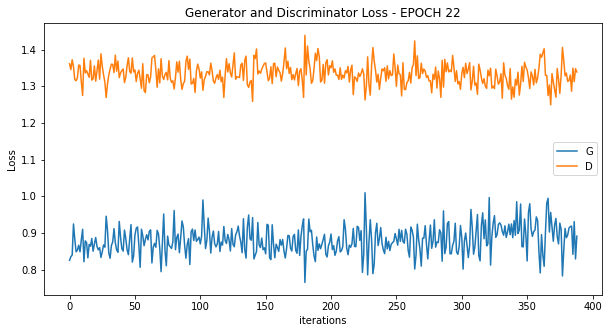

  0%|          | 0/389 [00:00<?, ?it/s]

[24/100][194/389] Loss_D: 1.3251 Loss_G: 0.9518 D(x): 0.4560 D(G(z)): 0.4199 / 0.3667
[24/100][388/389] Loss_D: 1.2828 Loss_G: 0.9213 D(x): 0.4812 D(G(z)): 0.4223 / 0.3832


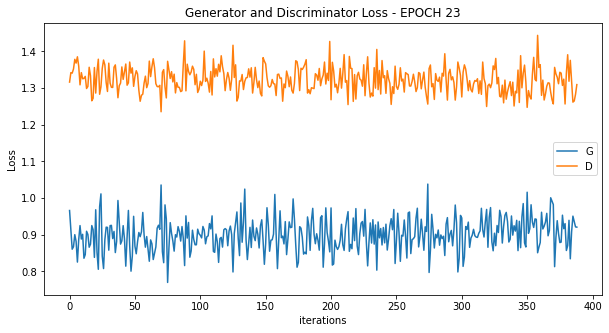

  0%|          | 0/389 [00:00<?, ?it/s]

[25/100][194/389] Loss_D: 1.2970 Loss_G: 0.9818 D(x): 0.4741 D(G(z)): 0.4225 / 0.3556
[25/100][388/389] Loss_D: 1.3051 Loss_G: 0.9688 D(x): 0.4411 D(G(z)): 0.3869 / 0.3623


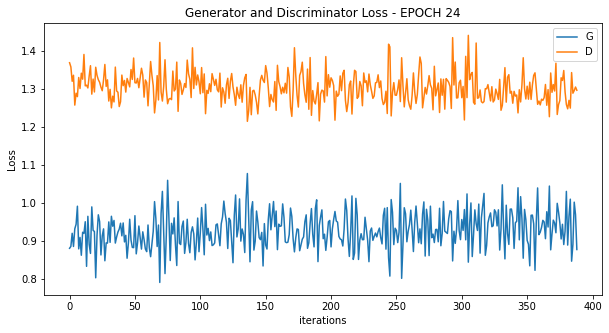

  0%|          | 0/389 [00:00<?, ?it/s]

[26/100][194/389] Loss_D: 1.2797 Loss_G: 0.9681 D(x): 0.4889 D(G(z)): 0.4235 / 0.3640
[26/100][388/389] Loss_D: 1.2686 Loss_G: 0.9792 D(x): 0.5075 D(G(z)): 0.4313 / 0.3577


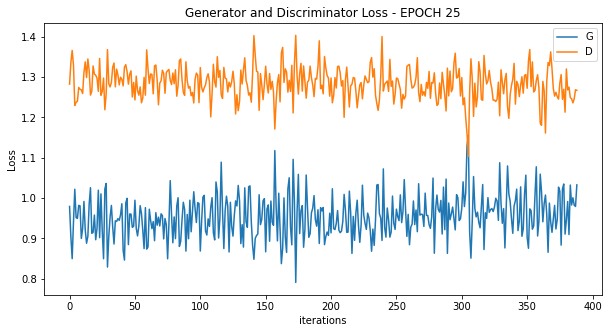

  0%|          | 0/389 [00:00<?, ?it/s]

[27/100][194/389] Loss_D: 1.2393 Loss_G: 1.0192 D(x): 0.4726 D(G(z)): 0.3775 / 0.3443
[27/100][388/389] Loss_D: 1.2378 Loss_G: 1.1829 D(x): 0.5735 D(G(z)): 0.4689 / 0.2854


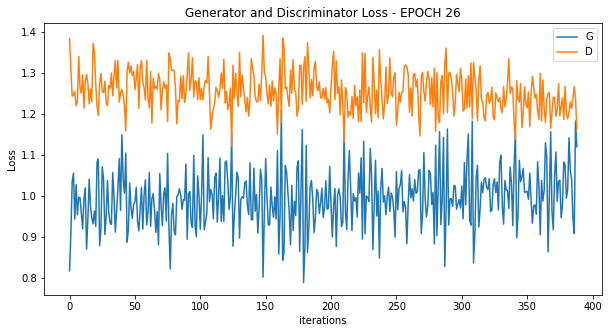

  0%|          | 0/389 [00:00<?, ?it/s]

[28/100][194/389] Loss_D: 1.2354 Loss_G: 1.0798 D(x): 0.4687 D(G(z)): 0.3643 / 0.3222
[28/100][388/389] Loss_D: 1.2713 Loss_G: 1.0966 D(x): 0.4387 D(G(z)): 0.3564 / 0.3139


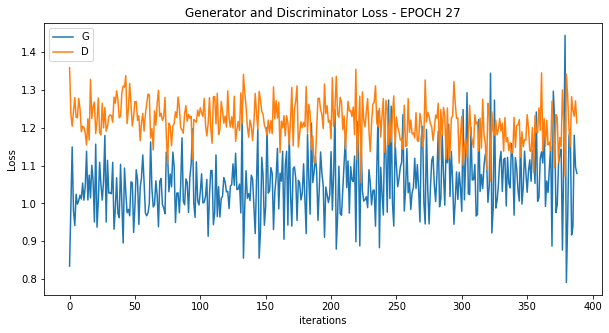

  0%|          | 0/389 [00:00<?, ?it/s]

[29/100][194/389] Loss_D: 1.3507 Loss_G: 0.8903 D(x): 0.4434 D(G(z)): 0.4071 / 0.4000
[29/100][388/389] Loss_D: 1.2031 Loss_G: 1.2306 D(x): 0.6557 D(G(z)): 0.4914 / 0.2772


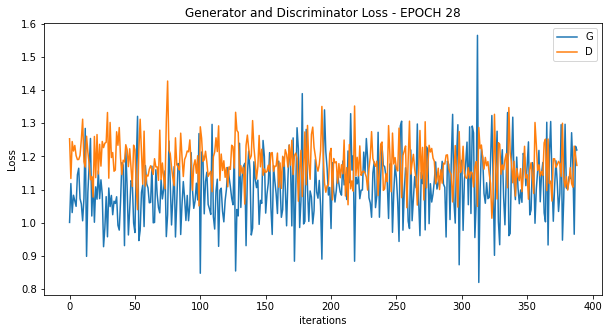

  0%|          | 0/389 [00:00<?, ?it/s]

[30/100][194/389] Loss_D: 1.2069 Loss_G: 1.3685 D(x): 0.6678 D(G(z)): 0.5046 / 0.2325
[30/100][388/389] Loss_D: 1.2010 Loss_G: 1.1250 D(x): 0.5349 D(G(z)): 0.3947 / 0.3058


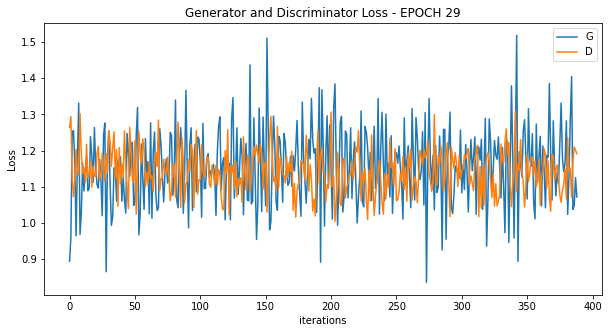

  0%|          | 0/389 [00:00<?, ?it/s]

[31/100][194/389] Loss_D: 1.0736 Loss_G: 1.2298 D(x): 0.6209 D(G(z)): 0.3960 / 0.2757
[31/100][388/389] Loss_D: 1.0334 Loss_G: 1.2762 D(x): 0.5753 D(G(z)): 0.3307 / 0.2668


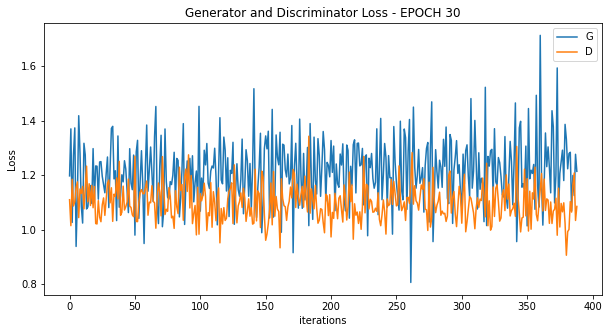

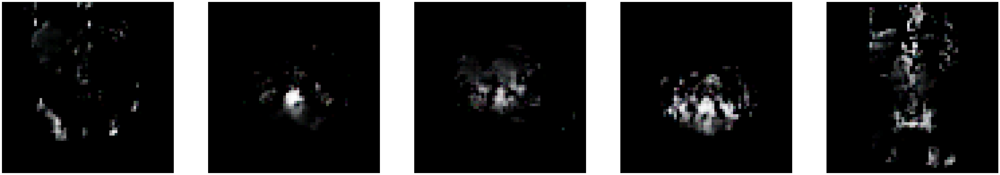

  0%|          | 0/389 [00:00<?, ?it/s]

[32/100][194/389] Loss_D: 1.0899 Loss_G: 1.2421 D(x): 0.5451 D(G(z)): 0.3479 / 0.2727
[32/100][388/389] Loss_D: 1.0131 Loss_G: 1.3951 D(x): 0.5650 D(G(z)): 0.3069 / 0.2385


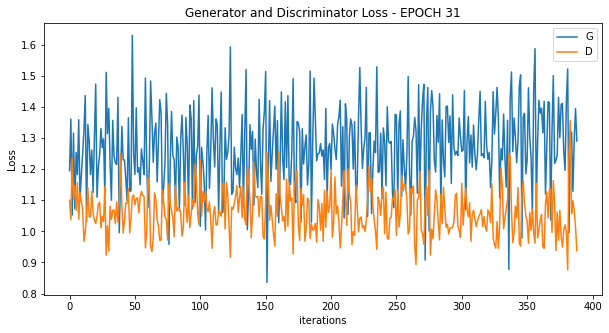

  0%|          | 0/389 [00:00<?, ?it/s]

[33/100][194/389] Loss_D: 0.9688 Loss_G: 1.2974 D(x): 0.5245 D(G(z)): 0.2485 / 0.2634
[33/100][388/389] Loss_D: 1.0805 Loss_G: 1.3935 D(x): 0.7189 D(G(z)): 0.4558 / 0.2346


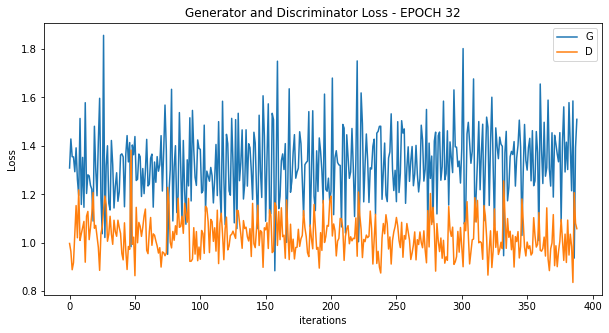

  0%|          | 0/389 [00:00<?, ?it/s]

[34/100][194/389] Loss_D: 1.0097 Loss_G: 1.4500 D(x): 0.5182 D(G(z)): 0.2485 / 0.2171
[34/100][388/389] Loss_D: 0.9841 Loss_G: 1.3404 D(x): 0.6297 D(G(z)): 0.3451 / 0.2439


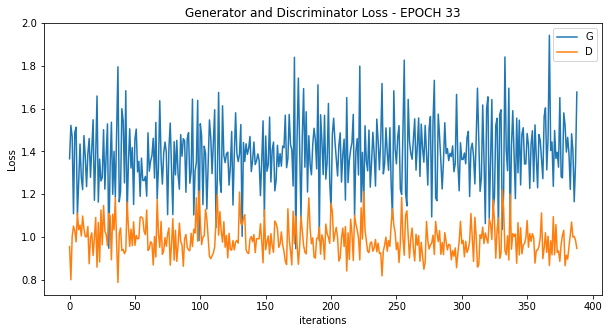

  0%|          | 0/389 [00:00<?, ?it/s]

[35/100][194/389] Loss_D: 0.9264 Loss_G: 1.2489 D(x): 0.5415 D(G(z)): 0.2263 / 0.2732
[35/100][388/389] Loss_D: 1.0492 Loss_G: 1.0212 D(x): 0.5122 D(G(z)): 0.2794 / 0.3549


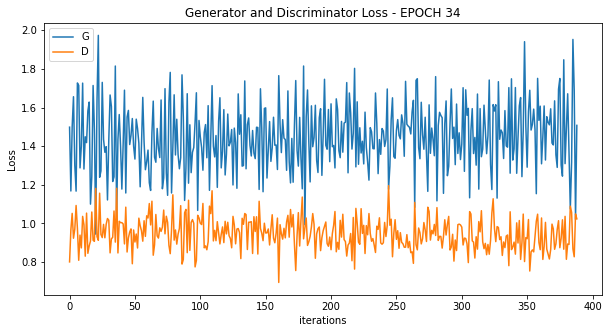

  0%|          | 0/389 [00:00<?, ?it/s]

[36/100][194/389] Loss_D: 0.8849 Loss_G: 1.5717 D(x): 0.6579 D(G(z)): 0.3006 / 0.1885
[36/100][388/389] Loss_D: 0.8765 Loss_G: 1.4399 D(x): 0.6528 D(G(z)): 0.2894 / 0.2288


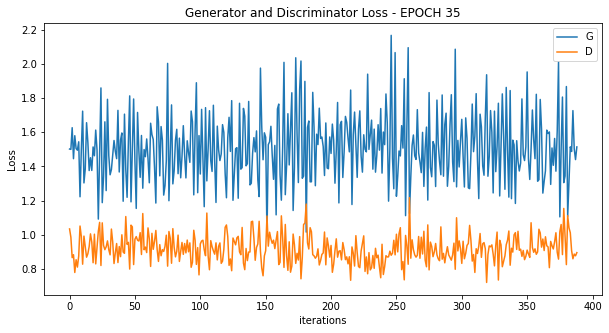

  0%|          | 0/389 [00:00<?, ?it/s]

[37/100][194/389] Loss_D: 0.8701 Loss_G: 1.6163 D(x): 0.6131 D(G(z)): 0.2290 / 0.1855
[37/100][388/389] Loss_D: 0.8593 Loss_G: 1.6688 D(x): 0.7612 D(G(z)): 0.3397 / 0.1736


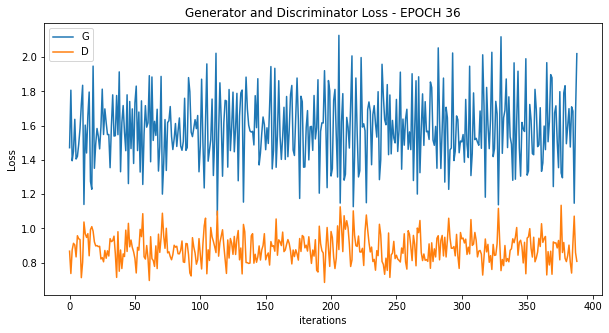

  0%|          | 0/389 [00:00<?, ?it/s]

[38/100][194/389] Loss_D: 0.8806 Loss_G: 1.6013 D(x): 0.6081 D(G(z)): 0.2553 / 0.1871
[38/100][388/389] Loss_D: 0.7288 Loss_G: 2.0656 D(x): 0.8251 D(G(z)): 0.2883 / 0.1207


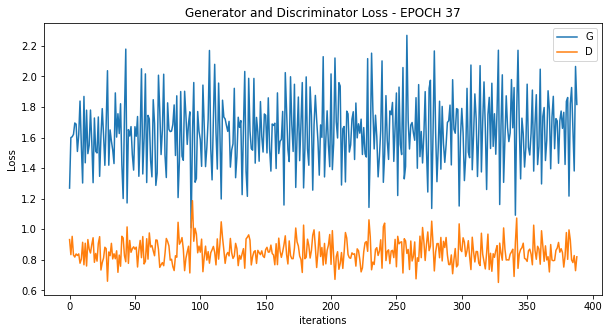

  0%|          | 0/389 [00:00<?, ?it/s]

[39/100][194/389] Loss_D: 0.8091 Loss_G: 1.6983 D(x): 0.8015 D(G(z)): 0.3052 / 0.1708
[39/100][388/389] Loss_D: 0.8144 Loss_G: 1.9844 D(x): 0.7157 D(G(z)): 0.2713 / 0.1239


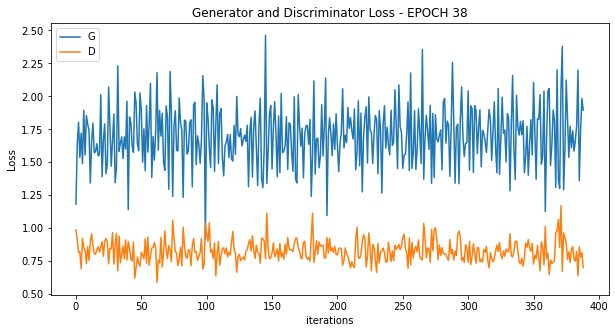

  0%|          | 0/389 [00:00<?, ?it/s]

[40/100][194/389] Loss_D: 0.8318 Loss_G: 1.5142 D(x): 0.5940 D(G(z)): 0.1962 / 0.2216
[40/100][388/389] Loss_D: 0.7173 Loss_G: 1.8530 D(x): 0.7490 D(G(z)): 0.2327 / 0.1513


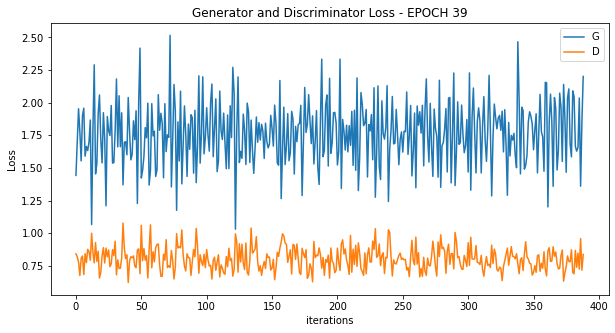

  0%|          | 0/389 [00:00<?, ?it/s]

[41/100][194/389] Loss_D: 0.8277 Loss_G: 1.7754 D(x): 0.6196 D(G(z)): 0.2151 / 0.1586
[41/100][388/389] Loss_D: 0.7255 Loss_G: 2.1473 D(x): 0.7265 D(G(z)): 0.2308 / 0.1094


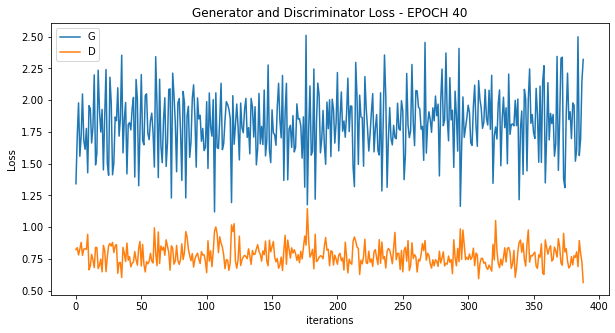

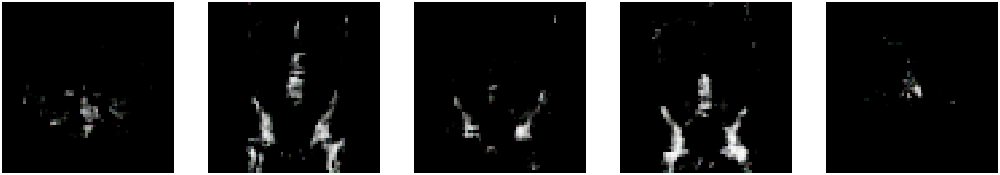

  0%|          | 0/389 [00:00<?, ?it/s]

[42/100][194/389] Loss_D: 0.7943 Loss_G: 1.8352 D(x): 0.7824 D(G(z)): 0.3074 / 0.1415
[42/100][388/389] Loss_D: 0.7377 Loss_G: 2.1716 D(x): 0.7441 D(G(z)): 0.2197 / 0.1080


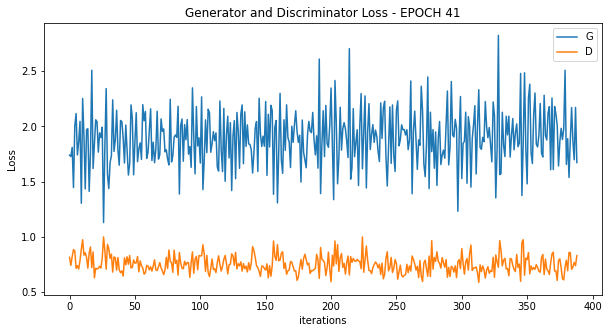

  0%|          | 0/389 [00:00<?, ?it/s]

[43/100][194/389] Loss_D: 0.7734 Loss_G: 1.6933 D(x): 0.6950 D(G(z)): 0.2081 / 0.1815
[43/100][388/389] Loss_D: 0.7653 Loss_G: 1.8663 D(x): 0.7445 D(G(z)): 0.2590 / 0.1408


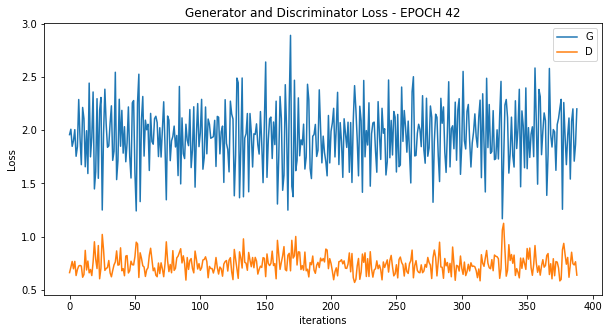

  0%|          | 0/389 [00:00<?, ?it/s]

[44/100][194/389] Loss_D: 0.6616 Loss_G: 2.3948 D(x): 0.8065 D(G(z)): 0.2231 / 0.0820
[44/100][388/389] Loss_D: 0.6234 Loss_G: 2.5218 D(x): 0.7706 D(G(z)): 0.1764 / 0.0720


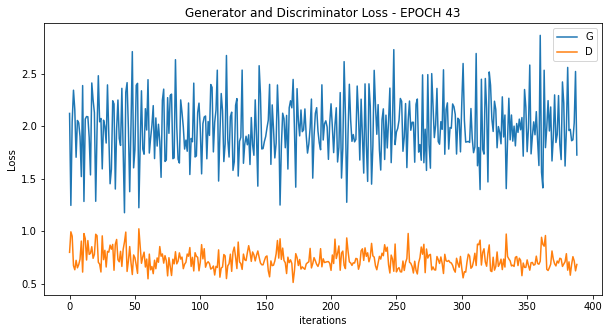

  0%|          | 0/389 [00:00<?, ?it/s]

[45/100][194/389] Loss_D: 0.6173 Loss_G: 1.9952 D(x): 0.7114 D(G(z)): 0.1295 / 0.1234
[45/100][388/389] Loss_D: 0.6497 Loss_G: 2.0998 D(x): 0.7376 D(G(z)): 0.1584 / 0.1138


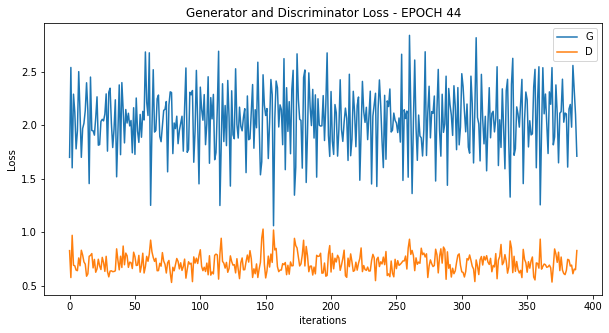

  0%|          | 0/389 [00:00<?, ?it/s]

[46/100][194/389] Loss_D: 0.6789 Loss_G: 1.8883 D(x): 0.6877 D(G(z)): 0.1629 / 0.1471
[46/100][388/389] Loss_D: 0.7143 Loss_G: 1.9836 D(x): 0.7130 D(G(z)): 0.1827 / 0.1344


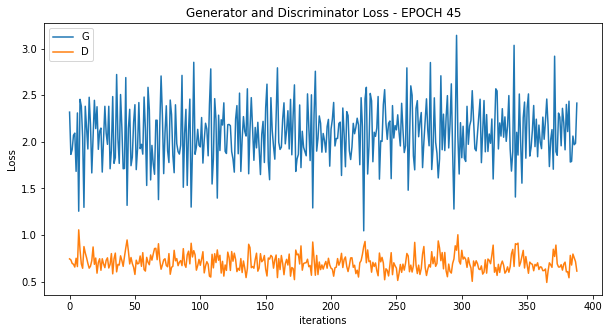

  0%|          | 0/389 [00:00<?, ?it/s]

[47/100][194/389] Loss_D: 0.6944 Loss_G: 2.0178 D(x): 0.6488 D(G(z)): 0.1342 / 0.1352
[47/100][388/389] Loss_D: 0.6600 Loss_G: 2.0377 D(x): 0.6216 D(G(z)): 0.0906 / 0.1253


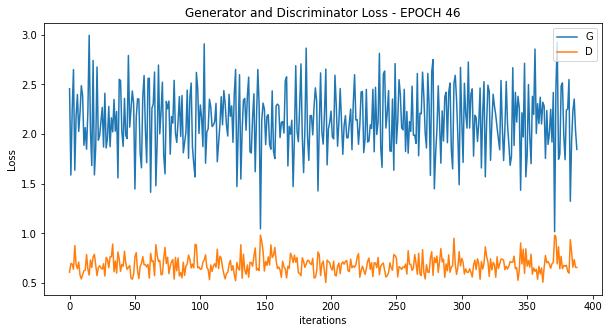

  0%|          | 0/389 [00:00<?, ?it/s]

[48/100][194/389] Loss_D: 0.7096 Loss_G: 2.7013 D(x): 0.9020 D(G(z)): 0.2903 / 0.0567
[48/100][388/389] Loss_D: 0.5868 Loss_G: 2.2051 D(x): 0.7991 D(G(z)): 0.1603 / 0.1023


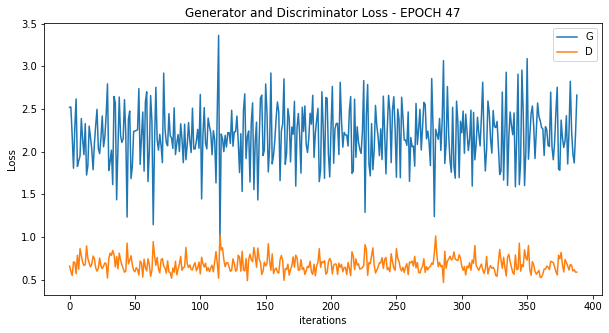

  0%|          | 0/389 [00:00<?, ?it/s]

[49/100][194/389] Loss_D: 0.5914 Loss_G: 2.2688 D(x): 0.7493 D(G(z)): 0.1381 / 0.0925
[49/100][388/389] Loss_D: 0.7846 Loss_G: 1.9766 D(x): 0.5665 D(G(z)): 0.0932 / 0.1423


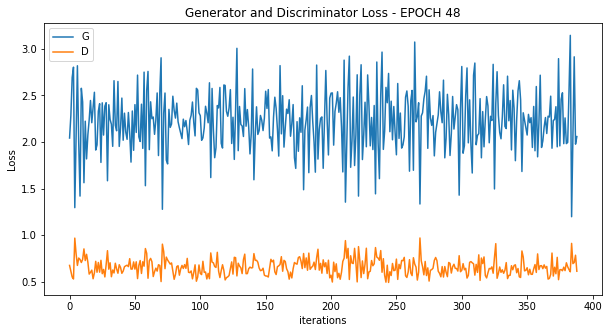

  0%|          | 0/389 [00:00<?, ?it/s]

[50/100][194/389] Loss_D: 0.5912 Loss_G: 2.2870 D(x): 0.7676 D(G(z)): 0.1646 / 0.0926
[50/100][388/389] Loss_D: 0.5056 Loss_G: 2.5507 D(x): 0.7900 D(G(z)): 0.1021 / 0.0789


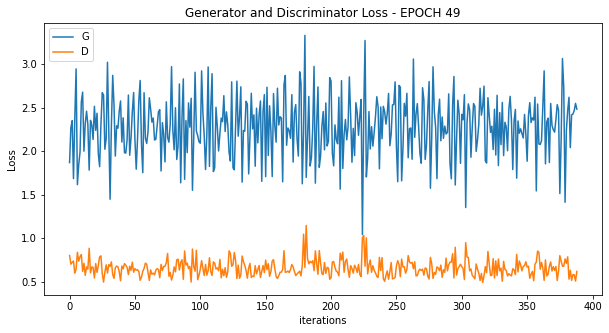

  0%|          | 0/389 [00:00<?, ?it/s]

[51/100][194/389] Loss_D: 0.6184 Loss_G: 2.3434 D(x): 0.7212 D(G(z)): 0.1275 / 0.0967
[51/100][388/389] Loss_D: 0.6995 Loss_G: 2.6260 D(x): 0.7828 D(G(z)): 0.2167 / 0.0685


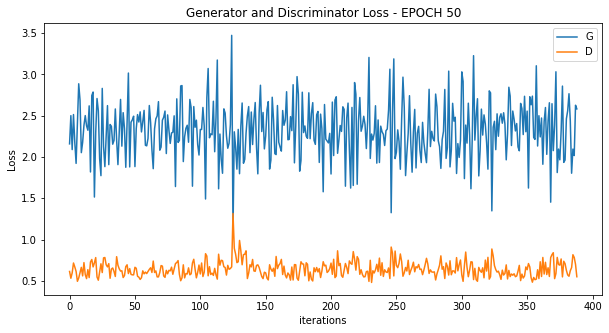

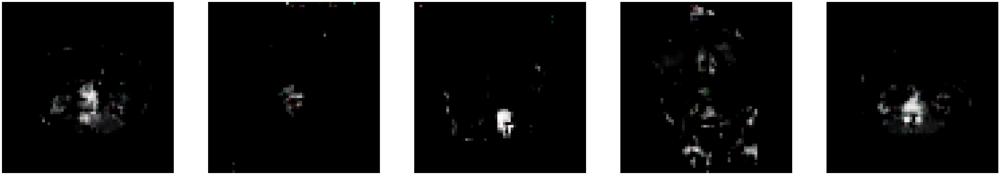

  0%|          | 0/389 [00:00<?, ?it/s]

[52/100][194/389] Loss_D: 0.7994 Loss_G: 2.3648 D(x): 0.6241 D(G(z)): 0.1558 / 0.1022
[52/100][388/389] Loss_D: 0.6387 Loss_G: 2.9276 D(x): 0.7949 D(G(z)): 0.1970 / 0.0450


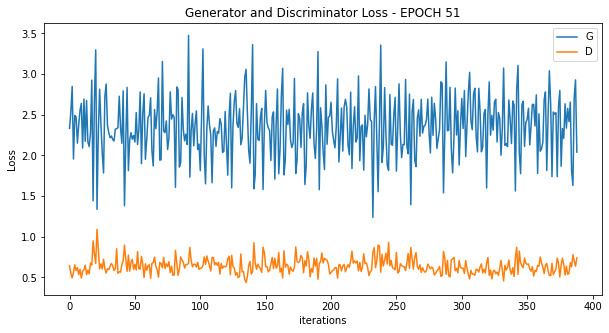

  0%|          | 0/389 [00:00<?, ?it/s]

[53/100][194/389] Loss_D: 0.6034 Loss_G: 2.7293 D(x): 0.7921 D(G(z)): 0.1798 / 0.0595
[53/100][388/389] Loss_D: 0.6064 Loss_G: 2.3424 D(x): 0.8199 D(G(z)): 0.1790 / 0.0943


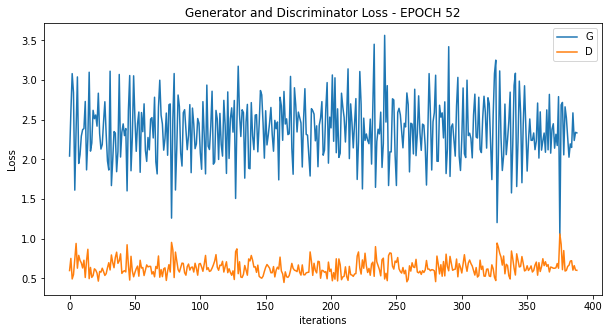

  0%|          | 0/389 [00:00<?, ?it/s]

[54/100][194/389] Loss_D: 0.6140 Loss_G: 1.9594 D(x): 0.8252 D(G(z)): 0.1806 / 0.1292
[54/100][388/389] Loss_D: 0.5517 Loss_G: 2.5642 D(x): 0.7698 D(G(z)): 0.1035 / 0.0708


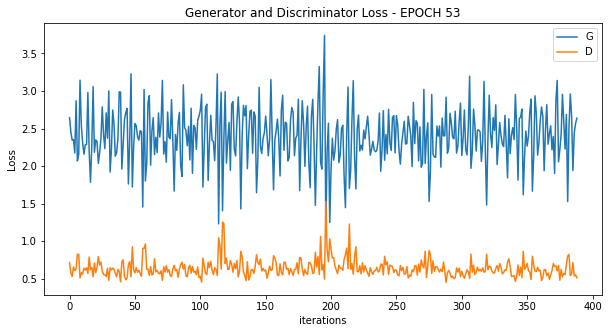

  0%|          | 0/389 [00:00<?, ?it/s]

[55/100][194/389] Loss_D: 0.6652 Loss_G: 2.5073 D(x): 0.8596 D(G(z)): 0.2202 / 0.0755
[55/100][388/389] Loss_D: 0.6036 Loss_G: 2.3638 D(x): 0.7174 D(G(z)): 0.1096 / 0.0929


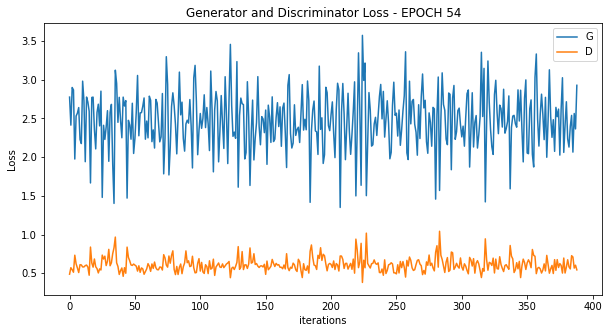

  0%|          | 0/389 [00:00<?, ?it/s]

[56/100][194/389] Loss_D: 1.1777 Loss_G: 2.7343 D(x): 0.8868 D(G(z)): 0.4957 / 0.0572
[56/100][388/389] Loss_D: 0.7166 Loss_G: 2.7035 D(x): 0.9277 D(G(z)): 0.2537 / 0.0636


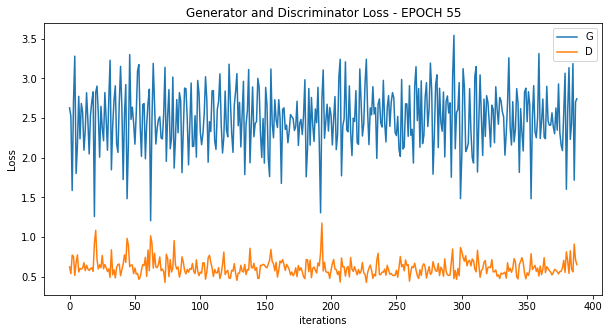

  0%|          | 0/389 [00:00<?, ?it/s]

[57/100][194/389] Loss_D: 0.5221 Loss_G: 2.4300 D(x): 0.7604 D(G(z)): 0.0961 / 0.0792
[57/100][388/389] Loss_D: 0.5355 Loss_G: 2.4545 D(x): 0.7476 D(G(z)): 0.0940 / 0.0836


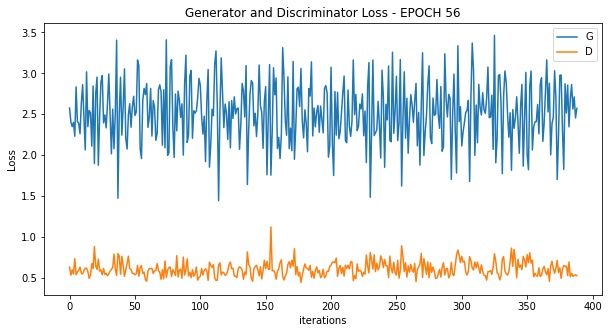

  0%|          | 0/389 [00:00<?, ?it/s]

[58/100][194/389] Loss_D: 0.5318 Loss_G: 2.5733 D(x): 0.8688 D(G(z)): 0.1327 / 0.0747
[58/100][388/389] Loss_D: 0.5596 Loss_G: 2.5022 D(x): 0.7298 D(G(z)): 0.0847 / 0.0739


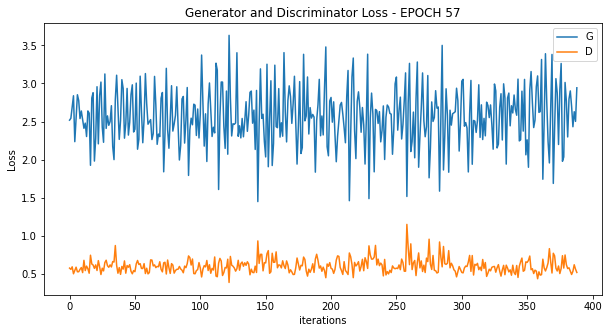

  0%|          | 0/389 [00:00<?, ?it/s]

[59/100][194/389] Loss_D: 0.5740 Loss_G: 2.9790 D(x): 0.8040 D(G(z)): 0.1404 / 0.0448
[59/100][388/389] Loss_D: 0.7082 Loss_G: 2.1912 D(x): 0.7402 D(G(z)): 0.1831 / 0.1207


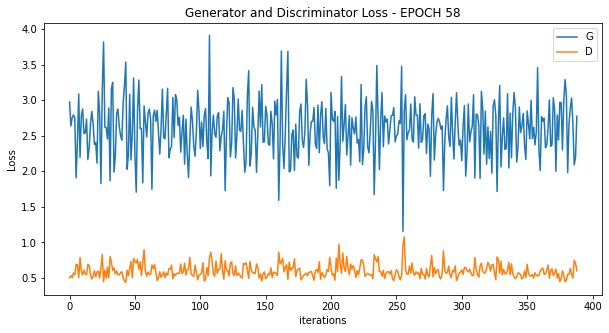

  0%|          | 0/389 [00:00<?, ?it/s]

[60/100][194/389] Loss_D: 0.7423 Loss_G: 1.7856 D(x): 0.6056 D(G(z)): 0.1199 / 0.1835
[60/100][388/389] Loss_D: 0.6064 Loss_G: 2.3573 D(x): 0.7165 D(G(z)): 0.1090 / 0.1064


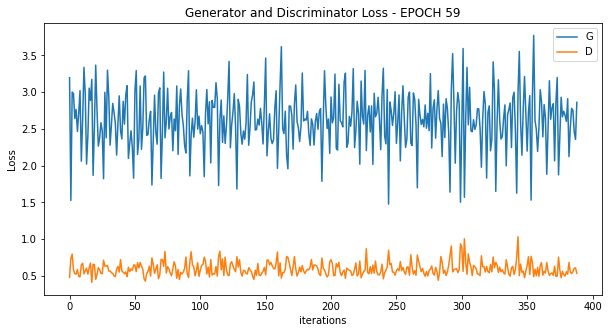

  0%|          | 0/389 [00:00<?, ?it/s]

[61/100][194/389] Loss_D: 0.6511 Loss_G: 2.1400 D(x): 0.6868 D(G(z)): 0.1295 / 0.1152
[61/100][388/389] Loss_D: 0.5732 Loss_G: 2.6263 D(x): 0.8289 D(G(z)): 0.1609 / 0.0656


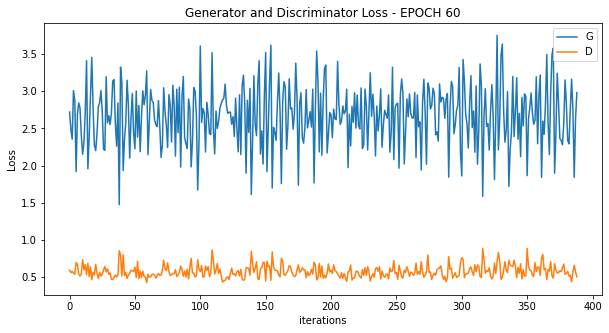

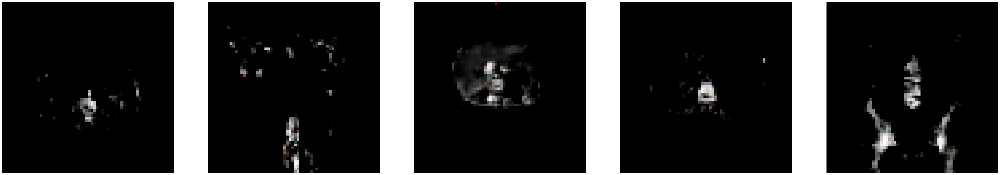

  0%|          | 0/389 [00:00<?, ?it/s]

[62/100][194/389] Loss_D: 0.6804 Loss_G: 3.2174 D(x): 0.9035 D(G(z)): 0.2505 / 0.0325
[62/100][388/389] Loss_D: 0.6987 Loss_G: 2.7304 D(x): 0.7231 D(G(z)): 0.1811 / 0.0599


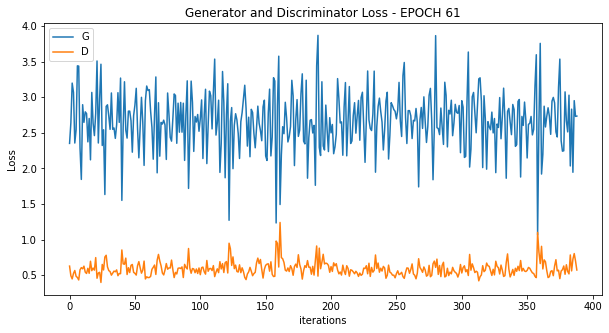

  0%|          | 0/389 [00:00<?, ?it/s]

[63/100][194/389] Loss_D: 0.5394 Loss_G: 2.9193 D(x): 0.8174 D(G(z)): 0.1206 / 0.0563
[63/100][388/389] Loss_D: 0.5479 Loss_G: 2.4016 D(x): 0.7096 D(G(z)): 0.0778 / 0.0864


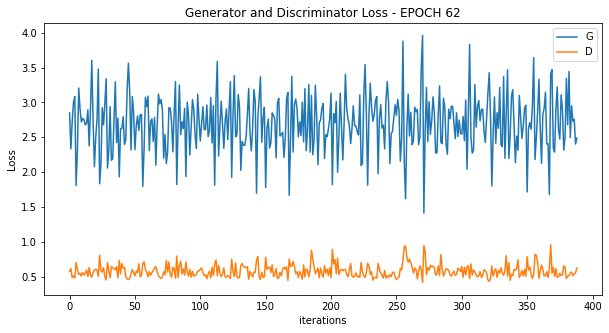

  0%|          | 0/389 [00:00<?, ?it/s]

[64/100][194/389] Loss_D: 0.6288 Loss_G: 3.2149 D(x): 0.9123 D(G(z)): 0.2070 / 0.0362
[64/100][388/389] Loss_D: 0.5121 Loss_G: 2.6946 D(x): 0.7987 D(G(z)): 0.0921 / 0.0644


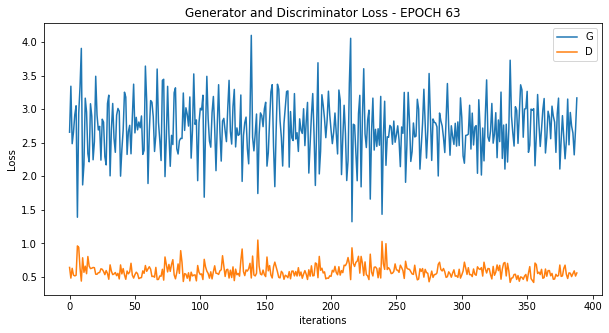

  0%|          | 0/389 [00:00<?, ?it/s]

[65/100][194/389] Loss_D: 0.5225 Loss_G: 2.8323 D(x): 0.8066 D(G(z)): 0.1043 / 0.0625
[65/100][388/389] Loss_D: 0.7268 Loss_G: 2.3634 D(x): 0.6001 D(G(z)): 0.0674 / 0.1085


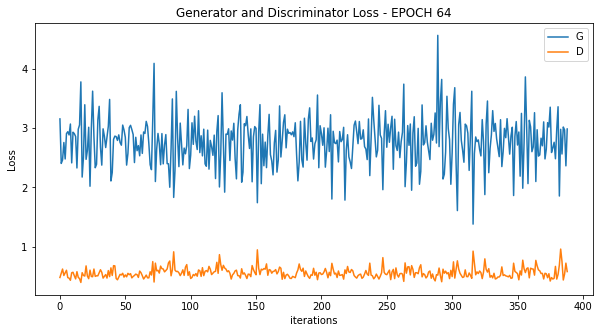

  0%|          | 0/389 [00:00<?, ?it/s]

[66/100][194/389] Loss_D: 0.5342 Loss_G: 2.6244 D(x): 0.7511 D(G(z)): 0.0752 / 0.0776
[66/100][388/389] Loss_D: 0.6701 Loss_G: 2.8323 D(x): 0.8183 D(G(z)): 0.2050 / 0.0542


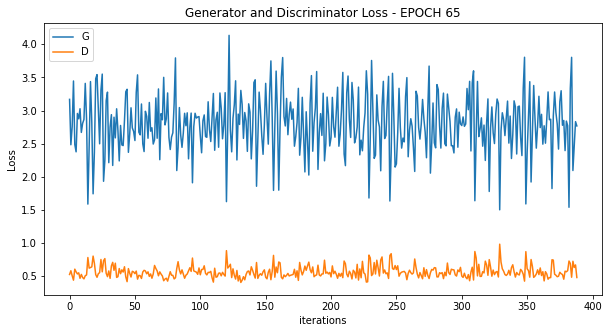

  0%|          | 0/389 [00:00<?, ?it/s]

[67/100][194/389] Loss_D: 1.0089 Loss_G: 3.1279 D(x): 0.9606 D(G(z)): 0.4100 / 0.0395
[67/100][388/389] Loss_D: 0.6687 Loss_G: 2.1546 D(x): 0.8624 D(G(z)): 0.2049 / 0.1062


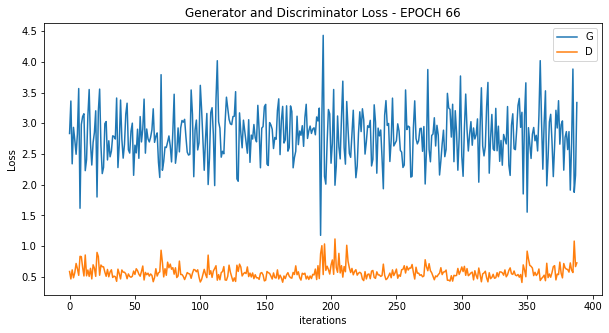

  0%|          | 0/389 [00:00<?, ?it/s]

[68/100][194/389] Loss_D: 0.4886 Loss_G: 3.3540 D(x): 0.7907 D(G(z)): 0.0675 / 0.0362
[68/100][388/389] Loss_D: 0.5463 Loss_G: 2.4806 D(x): 0.7353 D(G(z)): 0.0772 / 0.0866


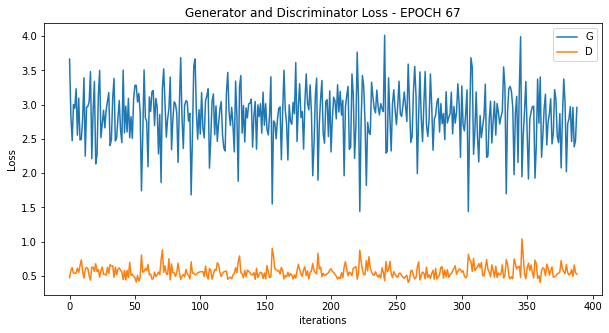

  0%|          | 0/389 [00:00<?, ?it/s]

[69/100][194/389] Loss_D: 0.4676 Loss_G: 3.3378 D(x): 0.8944 D(G(z)): 0.1056 / 0.0319
[69/100][388/389] Loss_D: 0.5138 Loss_G: 2.9843 D(x): 0.7830 D(G(z)): 0.0852 / 0.0529


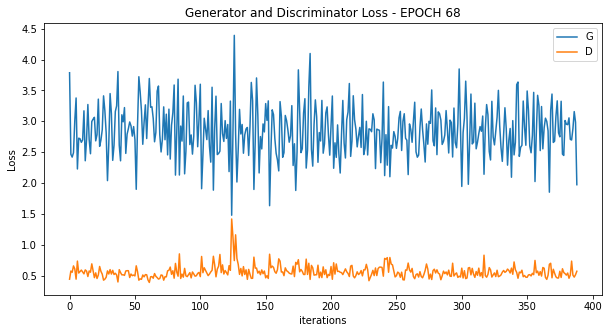

  0%|          | 0/389 [00:00<?, ?it/s]

[70/100][194/389] Loss_D: 0.6136 Loss_G: 2.4816 D(x): 0.7507 D(G(z)): 0.1097 / 0.0797
[70/100][388/389] Loss_D: 0.4837 Loss_G: 3.1809 D(x): 0.8568 D(G(z)): 0.1024 / 0.0352


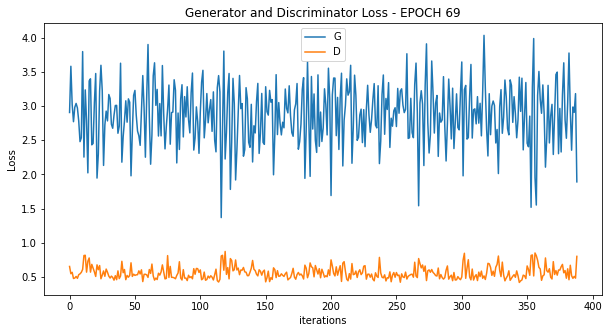

  0%|          | 0/389 [00:00<?, ?it/s]

[71/100][194/389] Loss_D: 0.4946 Loss_G: 2.7362 D(x): 0.8022 D(G(z)): 0.0898 / 0.0578
[71/100][388/389] Loss_D: 0.5543 Loss_G: 2.7721 D(x): 0.7550 D(G(z)): 0.0689 / 0.0673


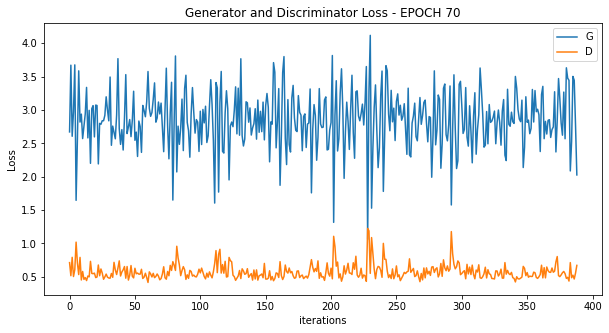

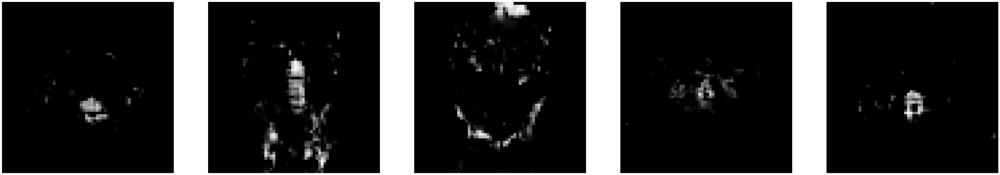

  0%|          | 0/389 [00:00<?, ?it/s]

[72/100][194/389] Loss_D: 0.5831 Loss_G: 3.3848 D(x): 0.9165 D(G(z)): 0.1786 / 0.0286
[72/100][388/389] Loss_D: 0.5289 Loss_G: 2.7707 D(x): 0.6985 D(G(z)): 0.0281 / 0.0659


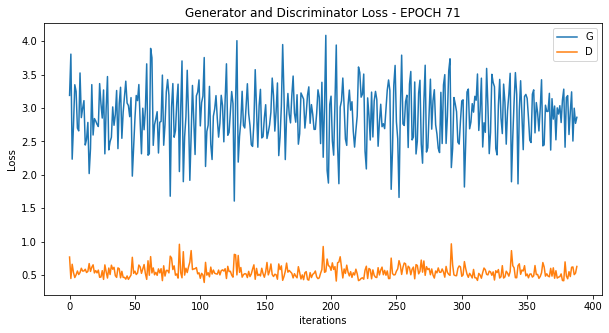

  0%|          | 0/389 [00:00<?, ?it/s]

[73/100][194/389] Loss_D: 0.5135 Loss_G: 2.6661 D(x): 0.8502 D(G(z)): 0.1289 / 0.0633
[73/100][388/389] Loss_D: 0.5190 Loss_G: 3.0991 D(x): 0.8910 D(G(z)): 0.1174 / 0.0438


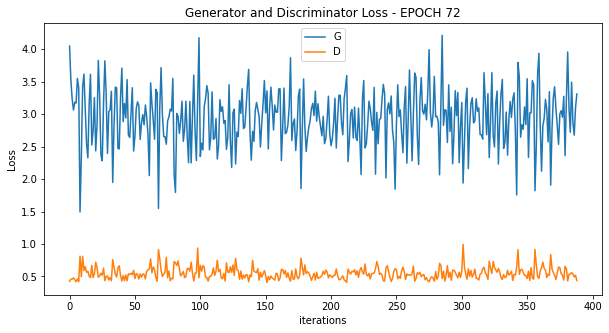

  0%|          | 0/389 [00:00<?, ?it/s]

[74/100][194/389] Loss_D: 0.5013 Loss_G: 3.2043 D(x): 0.8739 D(G(z)): 0.1140 / 0.0363
[74/100][388/389] Loss_D: 0.5308 Loss_G: 2.6519 D(x): 0.7492 D(G(z)): 0.0664 / 0.0792


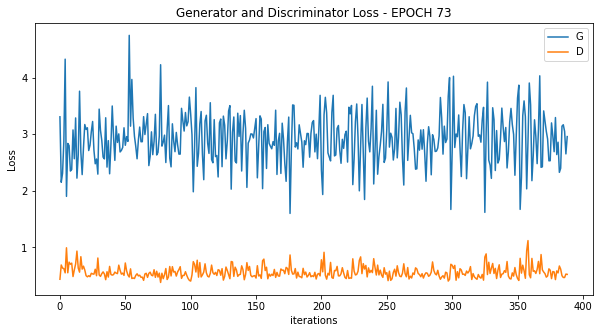

  0%|          | 0/389 [00:00<?, ?it/s]

[75/100][194/389] Loss_D: 0.7670 Loss_G: 2.1695 D(x): 0.5901 D(G(z)): 0.0959 / 0.1236
[75/100][388/389] Loss_D: 0.5343 Loss_G: 2.9013 D(x): 0.8257 D(G(z)): 0.1094 / 0.0553


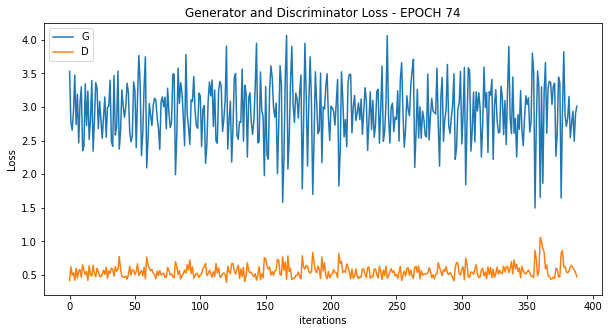

  0%|          | 0/389 [00:00<?, ?it/s]

[76/100][194/389] Loss_D: 0.4249 Loss_G: 3.4575 D(x): 0.8177 D(G(z)): 0.0437 / 0.0300
[76/100][388/389] Loss_D: 0.4838 Loss_G: 3.1464 D(x): 0.8369 D(G(z)): 0.0972 / 0.0387


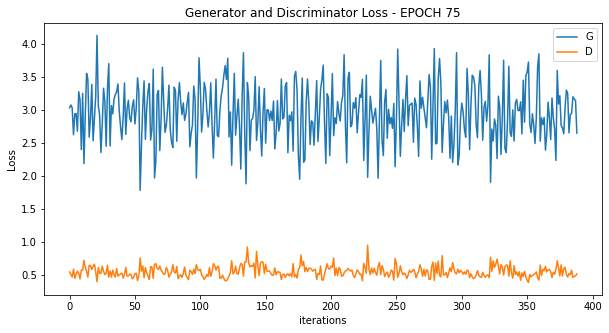

  0%|          | 0/389 [00:00<?, ?it/s]

[77/100][194/389] Loss_D: 0.5102 Loss_G: 3.3823 D(x): 0.7336 D(G(z)): 0.0360 / 0.0409
[77/100][388/389] Loss_D: 0.6705 Loss_G: 1.8631 D(x): 0.6280 D(G(z)): 0.0642 / 0.1746


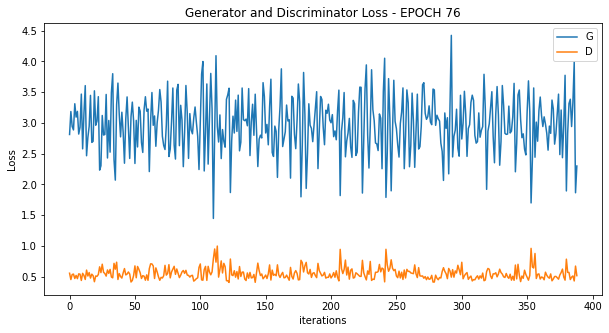

  0%|          | 0/389 [00:00<?, ?it/s]

[78/100][194/389] Loss_D: 0.5025 Loss_G: 2.9016 D(x): 0.7842 D(G(z)): 0.0700 / 0.0501
[78/100][388/389] Loss_D: 0.5888 Loss_G: 2.8749 D(x): 0.6833 D(G(z)): 0.0417 / 0.0824


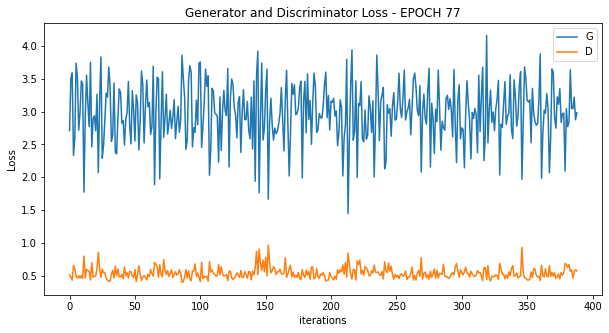

  0%|          | 0/389 [00:00<?, ?it/s]

[79/100][194/389] Loss_D: 0.4647 Loss_G: 3.4136 D(x): 0.8652 D(G(z)): 0.0891 / 0.0286
[79/100][388/389] Loss_D: 0.4335 Loss_G: 3.4018 D(x): 0.8641 D(G(z)): 0.0643 / 0.0323


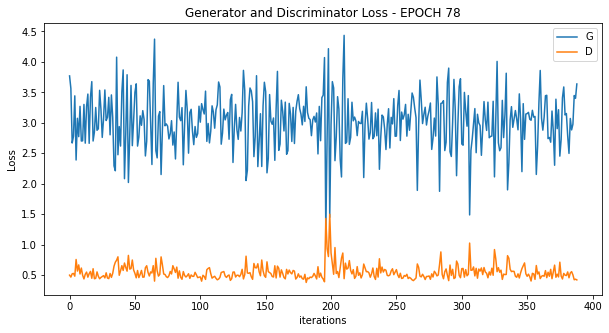

  0%|          | 0/389 [00:00<?, ?it/s]

[80/100][194/389] Loss_D: 0.6013 Loss_G: 2.7265 D(x): 0.7288 D(G(z)): 0.0771 / 0.0725
[80/100][388/389] Loss_D: 0.5145 Loss_G: 3.4998 D(x): 0.8319 D(G(z)): 0.0785 / 0.0321


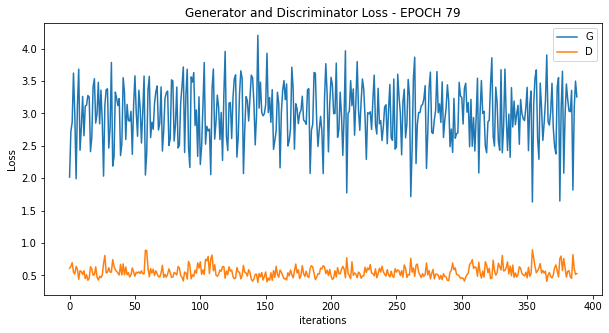

  0%|          | 0/389 [00:00<?, ?it/s]

[81/100][194/389] Loss_D: 0.4215 Loss_G: 3.4887 D(x): 0.8743 D(G(z)): 0.0565 / 0.0254
[81/100][388/389] Loss_D: 0.5765 Loss_G: 3.3633 D(x): 0.8946 D(G(z)): 0.1445 / 0.0306


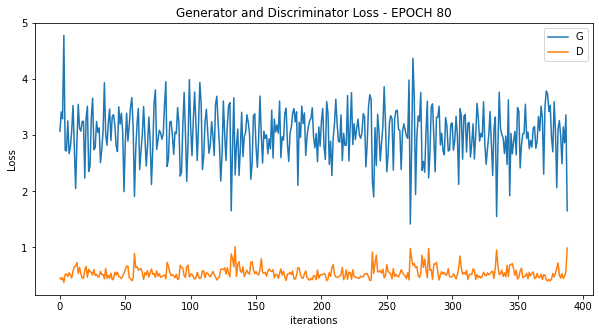

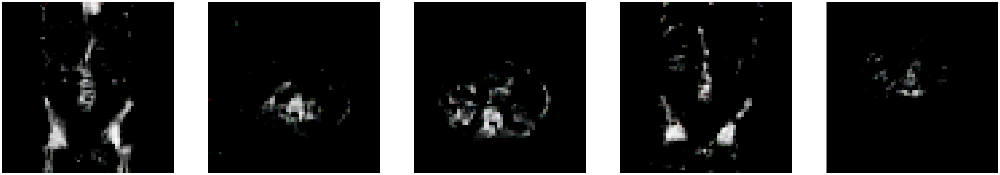

  0%|          | 0/389 [00:00<?, ?it/s]

[82/100][194/389] Loss_D: 0.4589 Loss_G: 3.2537 D(x): 0.8032 D(G(z)): 0.0337 / 0.0404
[82/100][388/389] Loss_D: 0.6385 Loss_G: 2.8737 D(x): 0.9061 D(G(z)): 0.1974 / 0.0525


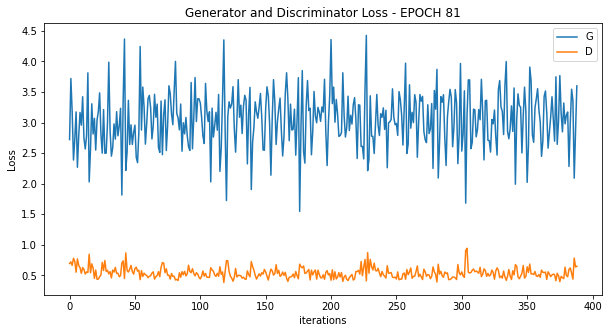

  0%|          | 0/389 [00:00<?, ?it/s]

[83/100][194/389] Loss_D: 0.4885 Loss_G: 3.3097 D(x): 0.8365 D(G(z)): 0.0674 / 0.0344
[83/100][388/389] Loss_D: 0.5185 Loss_G: 2.9003 D(x): 0.7403 D(G(z)): 0.0673 / 0.0512


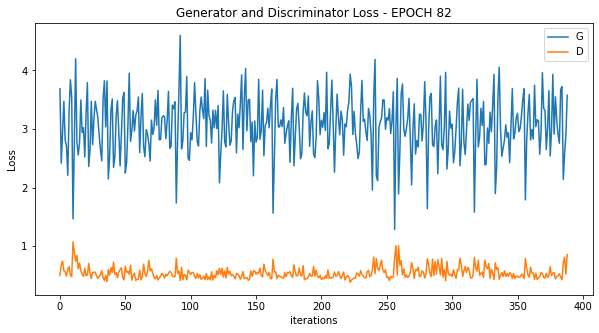

  0%|          | 0/389 [00:00<?, ?it/s]

[84/100][194/389] Loss_D: 0.4467 Loss_G: 3.2955 D(x): 0.8056 D(G(z)): 0.0352 / 0.0440
[84/100][388/389] Loss_D: 0.5892 Loss_G: 2.5585 D(x): 0.7077 D(G(z)): 0.0535 / 0.0805


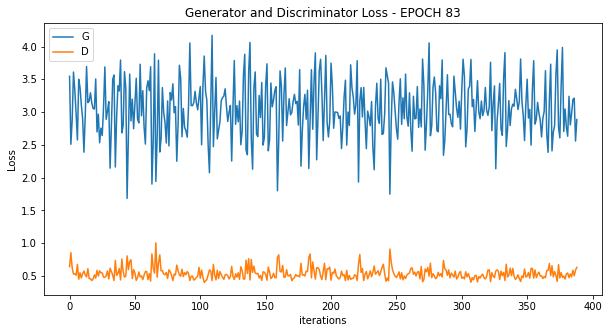

  0%|          | 0/389 [00:00<?, ?it/s]

[85/100][194/389] Loss_D: 0.5396 Loss_G: 2.8337 D(x): 0.7430 D(G(z)): 0.0713 / 0.0593
[85/100][388/389] Loss_D: 0.4492 Loss_G: 3.5999 D(x): 0.8847 D(G(z)): 0.0748 / 0.0225


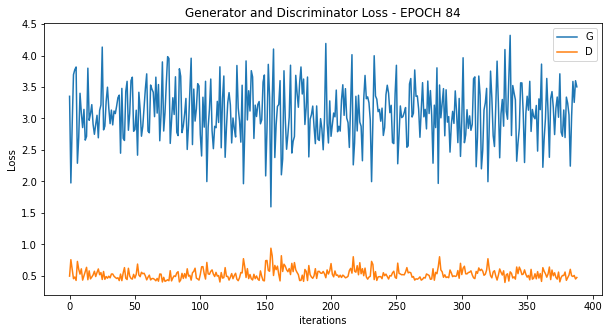

  0%|          | 0/389 [00:00<?, ?it/s]

[86/100][194/389] Loss_D: 0.4956 Loss_G: 3.3423 D(x): 0.9379 D(G(z)): 0.1113 / 0.0322
[86/100][388/389] Loss_D: 0.4121 Loss_G: 2.8700 D(x): 0.8890 D(G(z)): 0.0549 / 0.0534


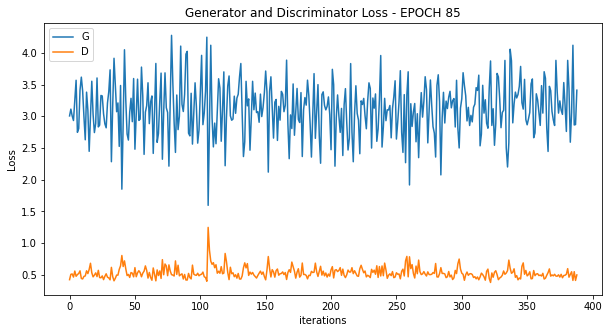

  0%|          | 0/389 [00:00<?, ?it/s]

[87/100][194/389] Loss_D: 0.5245 Loss_G: 2.7558 D(x): 0.8599 D(G(z)): 0.1237 / 0.0614
[87/100][388/389] Loss_D: 0.6271 Loss_G: 2.5687 D(x): 0.8283 D(G(z)): 0.1773 / 0.0735


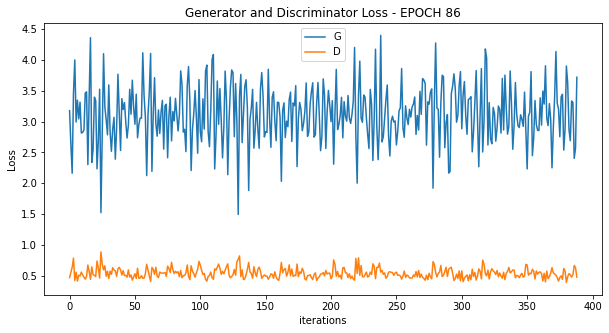

  0%|          | 0/389 [00:00<?, ?it/s]

[88/100][194/389] Loss_D: 0.5828 Loss_G: 3.5307 D(x): 0.7446 D(G(z)): 0.0707 / 0.0298
[88/100][388/389] Loss_D: 0.6897 Loss_G: 2.2704 D(x): 0.5889 D(G(z)): 0.0398 / 0.1228


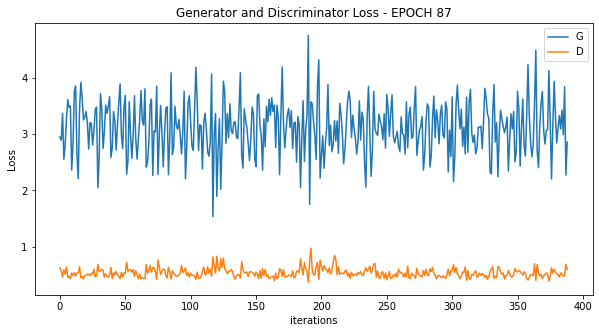

  0%|          | 0/389 [00:00<?, ?it/s]

[89/100][194/389] Loss_D: 0.4626 Loss_G: 3.3542 D(x): 0.8658 D(G(z)): 0.0650 / 0.0304
[89/100][388/389] Loss_D: 0.5461 Loss_G: 3.3449 D(x): 0.9360 D(G(z)): 0.1516 / 0.0340


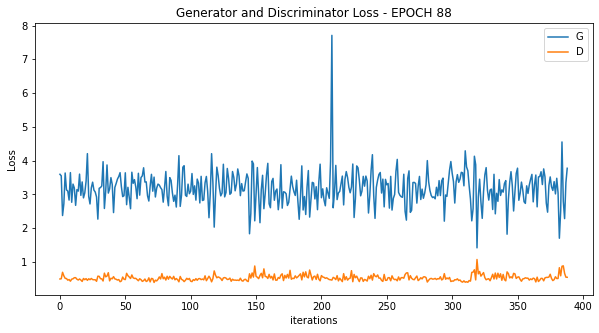

  0%|          | 0/389 [00:00<?, ?it/s]

[90/100][194/389] Loss_D: 0.4944 Loss_G: 3.0882 D(x): 0.8645 D(G(z)): 0.0677 / 0.0571
[90/100][388/389] Loss_D: 0.5397 Loss_G: 3.0603 D(x): 0.7877 D(G(z)): 0.1038 / 0.0422


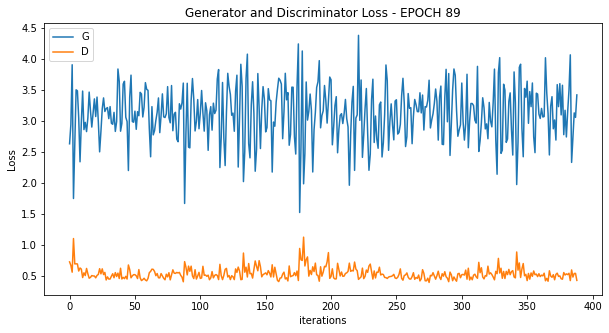

  0%|          | 0/389 [00:00<?, ?it/s]

[91/100][194/389] Loss_D: 0.4939 Loss_G: 3.2173 D(x): 0.8547 D(G(z)): 0.0927 / 0.0370
[91/100][388/389] Loss_D: 0.4773 Loss_G: 2.5232 D(x): 0.7940 D(G(z)): 0.0674 / 0.0789


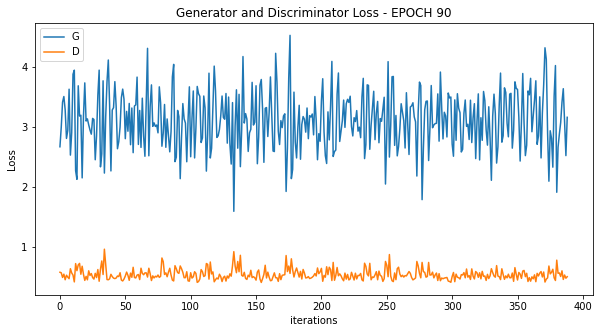

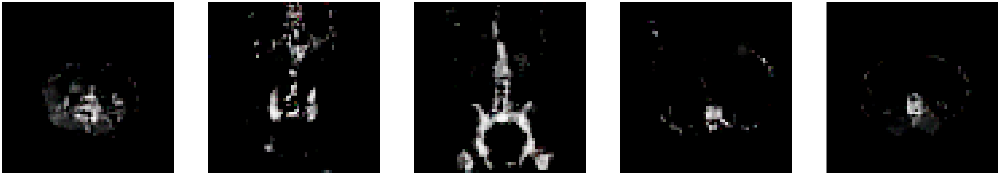

  0%|          | 0/389 [00:00<?, ?it/s]

[92/100][194/389] Loss_D: 0.4969 Loss_G: 2.7219 D(x): 0.7939 D(G(z)): 0.0893 / 0.0606
[92/100][388/389] Loss_D: 0.5230 Loss_G: 3.5859 D(x): 0.9393 D(G(z)): 0.1214 / 0.0242


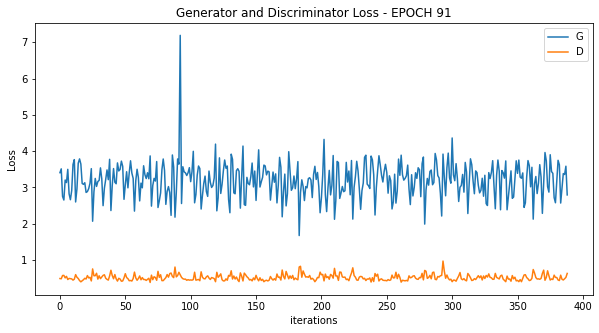

  0%|          | 0/389 [00:00<?, ?it/s]

[93/100][194/389] Loss_D: 0.6907 Loss_G: 2.6334 D(x): 0.9134 D(G(z)): 0.1922 / 0.0749
[93/100][388/389] Loss_D: 0.4581 Loss_G: 3.0975 D(x): 0.9279 D(G(z)): 0.0769 / 0.0446


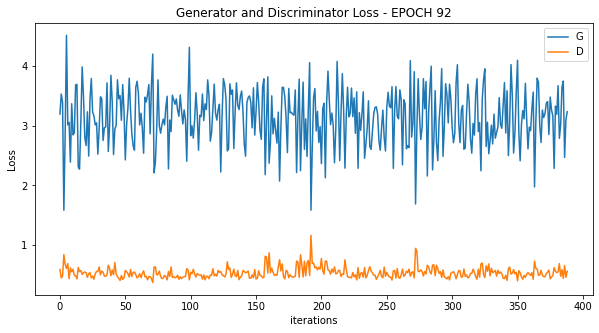

  0%|          | 0/389 [00:00<?, ?it/s]

[94/100][194/389] Loss_D: 0.5674 Loss_G: 2.5748 D(x): 0.7595 D(G(z)): 0.0965 / 0.0766
[94/100][388/389] Loss_D: 0.4170 Loss_G: 3.9843 D(x): 0.9251 D(G(z)): 0.0558 / 0.0177


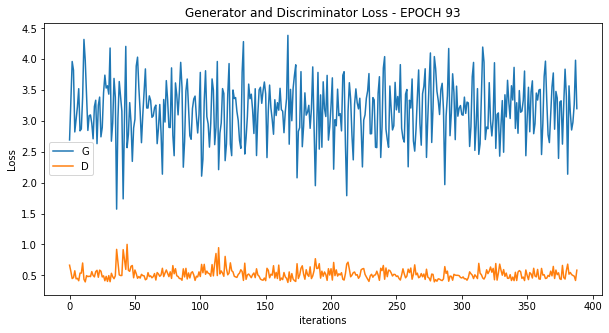

  0%|          | 0/389 [00:00<?, ?it/s]

[95/100][194/389] Loss_D: 0.5145 Loss_G: 3.2553 D(x): 0.9464 D(G(z)): 0.1128 / 0.0373
[95/100][388/389] Loss_D: 0.7261 Loss_G: 3.1657 D(x): 0.9320 D(G(z)): 0.2471 / 0.0411


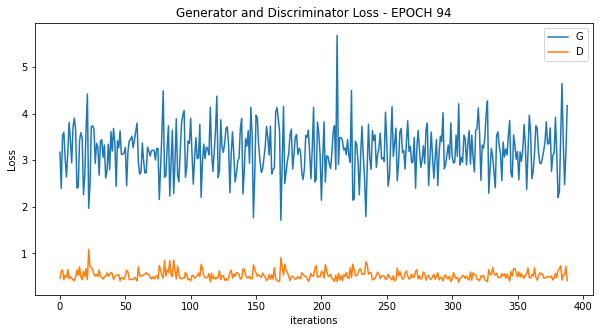

  0%|          | 0/389 [00:00<?, ?it/s]

[96/100][194/389] Loss_D: 0.6781 Loss_G: 2.7505 D(x): 0.6023 D(G(z)): 0.0345 / 0.0875
[96/100][388/389] Loss_D: 0.5858 Loss_G: 2.6719 D(x): 0.7090 D(G(z)): 0.0644 / 0.0798


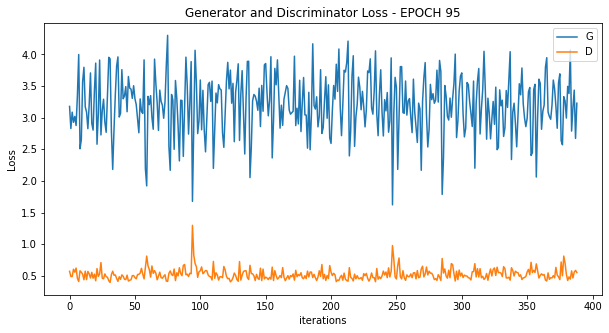

  0%|          | 0/389 [00:00<?, ?it/s]

[97/100][194/389] Loss_D: 0.6603 Loss_G: 3.4830 D(x): 0.9390 D(G(z)): 0.2180 / 0.0286
[97/100][388/389] Loss_D: 0.4381 Loss_G: 3.5320 D(x): 0.9428 D(G(z)): 0.0638 / 0.0258


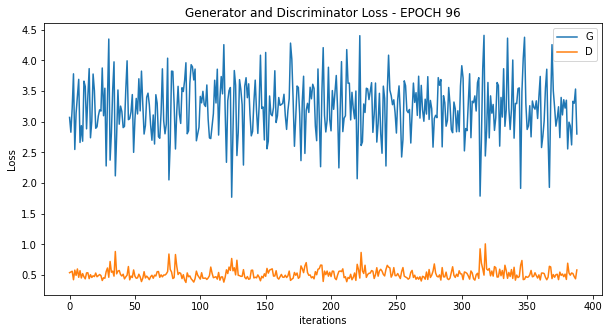

  0%|          | 0/389 [00:00<?, ?it/s]

[98/100][194/389] Loss_D: 0.5341 Loss_G: 3.5869 D(x): 0.7392 D(G(z)): 0.0546 / 0.0286
[98/100][388/389] Loss_D: 0.5841 Loss_G: 3.2669 D(x): 0.9014 D(G(z)): 0.1904 / 0.0319


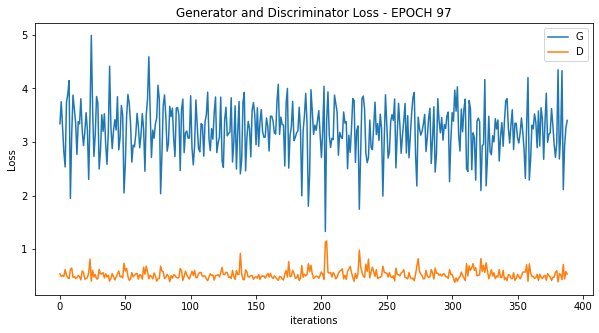

  0%|          | 0/389 [00:00<?, ?it/s]

[99/100][194/389] Loss_D: 0.4634 Loss_G: 3.1148 D(x): 0.8485 D(G(z)): 0.0640 / 0.0429
[99/100][388/389] Loss_D: 0.6302 Loss_G: 2.5003 D(x): 0.6718 D(G(z)): 0.0761 / 0.0853


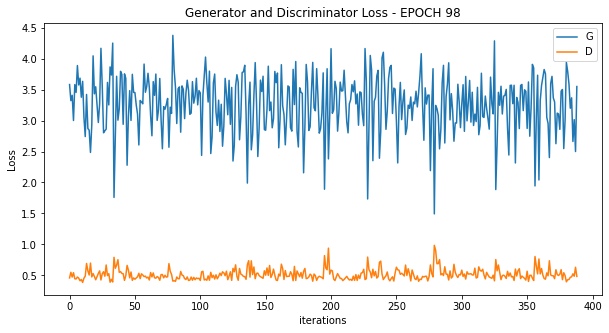

  0%|          | 0/389 [00:00<?, ?it/s]

[100/100][194/389] Loss_D: 0.5111 Loss_G: 3.0901 D(x): 0.7297 D(G(z)): 0.0405 / 0.0530
[100/100][388/389] Loss_D: 0.6682 Loss_G: 2.6499 D(x): 0.7944 D(G(z)): 0.1702 / 0.0719


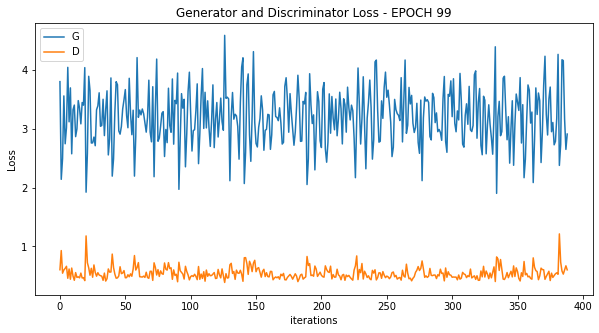

In [20]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [21]:
print("Happy GAN's")

Happy GAN's
